## Distracted Driver Detection using DL

In [1]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import tensorflow as tf
import keras
from tensorflow.keras.preprocessing.image import ImageDataGenerator # Updated import
from keras import applications
from keras.models import Sequential, load_model
from keras.layers import Conv2D, MaxPooling2D, GlobalAveragePooling2D, Flatten, Dense, Dropout
from keras.preprocessing import image
from keras.models import Model
from tensorflow import keras
from keras import layers

In [3]:
# TRAINING_EPOCHS = 10
# BATCH_SIZE = 32

In [4]:
!pip install kaggle

In [5]:
!mkdir -p ~/.kaggle
!mv /content/kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json # Set restrictive permissions for security

In [6]:
# This command will download the data into your current working directory.
# Install the Kaggle API
!pip install kaggle

# Create a directory for Kaggle credentials
!mkdir -p ~/.kaggle

# Move your Kaggle API key (kaggle.json) into the correct directory
# Make sure you have already uploaded your kaggle.json file to your Colab environment
# via the file browser or other means.
!mv /content/kaggle.json ~/.kaggle/

# Set restrictive permissions for security (required by Kaggle API)
!chmod 600 ~/.kaggle/kaggle.json

# Download the dataset using the Kaggle API
# The dataset identifier is 'rightway11/state-farm-distracted-driver-detection' from the URL
!kaggle datasets download -d rightway11/state-farm-distracted-driver-detection

# Unzip the downloaded dataset
# Use the -o flag to automatically overwrite existing files
!unzip -o state-farm-distracted-driver-detection.zip

# (Optional) List the contents to see the file structure
!ls /content/
!ls /content/state-farm-distracted-driver-detection/

Streaming output truncated to the last 5000 lines.
  inflating: imgs/train/c6/img_87017.jpg  
  inflating: imgs/train/c6/img_87034.jpg  
  inflating: imgs/train/c6/img_87158.jpg  
  inflating: imgs/train/c6/img_8716.jpg  
  inflating: imgs/train/c6/img_87165.jpg  
  inflating: imgs/train/c6/img_87168.jpg  
  inflating: imgs/train/c6/img_87341.jpg  
  inflating: imgs/train/c6/img_8736.jpg  
  inflating: imgs/train/c6/img_87360.jpg  
  inflating: imgs/train/c6/img_875.jpg  
  inflating: imgs/train/c6/img_87505.jpg  
  inflating: imgs/train/c6/img_87601.jpg  
  inflating: imgs/train/c6/img_87651.jpg  
  inflating: imgs/train/c6/img_8779.jpg  
  inflating: imgs/train/c6/img_879.jpg  
  inflating: imgs/train/c6/img_87902.jpg  
  inflating: imgs/train/c6/img_87915.jpg  
  inflating: imgs/train/c6/img_87939.jpg  
  inflating: imgs/train/c6/img_8796.jpg  
  inflating: imgs/train/c6/img_87988.jpg  
  inflating: imgs/train/c6/img_87990.jpg  
  inflating: imgs/train/c6/img_88007.jpg  
  inflating

In [7]:
!unzip -o state-farm-distracted-driver-detection.zip

Streaming output truncated to the last 5000 lines.
  inflating: imgs/train/c6/img_86769.jpg  
  inflating: imgs/train/c6/img_86803.jpg  
  inflating: imgs/train/c6/img_86869.jpg  
  inflating: imgs/train/c6/img_87017.jpg  
  inflating: imgs/train/c6/img_87034.jpg  
  inflating: imgs/train/c6/img_87158.jpg  
  inflating: imgs/train/c6/img_8716.jpg  
  inflating: imgs/train/c6/img_87165.jpg  
  inflating: imgs/train/c6/img_87168.jpg  
  inflating: imgs/train/c6/img_87341.jpg  
  inflating: imgs/train/c6/img_8736.jpg  
  inflating: imgs/train/c6/img_87360.jpg  
  inflating: imgs/train/c6/img_875.jpg  
  inflating: imgs/train/c6/img_87505.jpg  
  inflating: imgs/train/c6/img_87601.jpg  
  inflating: imgs/train/c6/img_87651.jpg  
  inflating: imgs/train/c6/img_8779.jpg  
  inflating: imgs/train/c6/img_879.jpg  
  inflating: imgs/train/c6/img_87902.jpg  
  inflating: imgs/train/c6/img_87915.jpg  
  inflating: imgs/train/c6/img_87939.jpg  
  inflating: imgs/train/c6/img_8796.jpg  
  inflating

In [8]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image # For image handling
import os # For file system operations

# Set some plot styles
sns.set_style("whitegrid")
plt.rcParams['figure.figsize'] = (10, 7)
plt.rcParams['font.size'] = 12

In [9]:
data_dir = '/content/state-farm-distracted-driver-detection/train'
image_paths = []
labels = []

# Iterate over the subdirectories in the data directory
for class_name in os.listdir(data_dir):
    class_dir = os.path.join(data_dir, class_name)
    if os.path.isdir(class_dir):
        # Get the list of image files in the class directory
        image_files = os.listdir(class_dir)
        # Append the image paths and labels
        image_paths.extend([os.path.join(class_dir, img_file) for img_file in image_files])
        labels.extend([class_name] * len(image_files))

# Create a DataFrame from the image paths and labels
data = {'filename': image_paths, 'label': labels}
train_df = pd.DataFrame(data)

# Print the resulting DataFrame
print(train_df.head())

                                            filename label
0  /content/state-farm-distracted-driver-detectio...    c9
1  /content/state-farm-distracted-driver-detectio...    c9
2  /content/state-farm-distracted-driver-detectio...    c9
3  /content/state-farm-distracted-driver-detectio...    c9
4  /content/state-farm-distracted-driver-detectio...    c9


In [10]:
data_dir = '/content/state-farm-distracted-driver-detection/train'
image_paths = []
labels = []

# Iterate over the subdirectories in the data directory
for class_name in os.listdir(data_dir):
    class_dir = os.path.join(data_dir, class_name)
    if os.path.isdir(class_dir):
        # Get the list of image files in the class directory
        image_files = os.listdir(class_dir)
        # Append the image paths and labels
        image_paths.extend([os.path.join(class_dir, img_file) for img_file in image_files])
        labels.extend([class_name] * len(image_files))

# Create a DataFrame from the image paths and labels
data = {'filename': image_paths, 'label': labels}
train_df = pd.DataFrame(data)

# Print the resulting DataFrame
print(train_df.head())

                                            filename label
0  /content/state-farm-distracted-driver-detectio...    c9
1  /content/state-farm-distracted-driver-detectio...    c9
2  /content/state-farm-distracted-driver-detectio...    c9
3  /content/state-farm-distracted-driver-detectio...    c9
4  /content/state-farm-distracted-driver-detectio...    c9


<Axes: title={'center': 'Train data distribution'}, ylabel='count'>

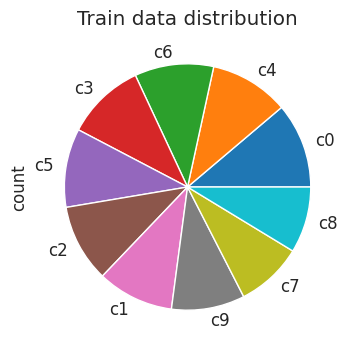

In [11]:
# plot a pie chart
train_df['label'].value_counts().plot(kind='pie', figsize=(4, 4), title='Train data distribution')

In [ ]:
train_df['filename'][1]

'/content/state-farm-distracted-driver-detection/train/c9/img_59210.jpg'

In [ ]:
main_path = '/content/distracted-driver-detection'

In [ ]:
# Data agumentation and pre-processing using tensorflow
gen = ImageDataGenerator(rescale         = 1./255.,
                         horizontal_flip = True,
                         vertical_flip   = False,
                         zoom_range      = 0.05,
                         rotation_range  = 25)

train_generator = gen.flow_from_dataframe(
    train_df, # dataframe
    directory = main_path + '/train', # images data path / folder in which images are there
    x_col = 'filename',
    y_col = 'label',
    color_mode = "rgb",
    target_size = (180, 180), # image height , image width
    class_mode = "categorical",
    batch_size = 32,
    shuffle = True,
    seed = 42,
    # validate_filenames=False
    )

Found 17462 validated image filenames belonging to 10 classes.


In [ ]:
import os

def count_images_in_directory(directory):
    total = 0
    for subdir, _, files in os.walk(directory):
        image_files = [f for f in files if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
        total += len(image_files)
    return total

train_dir = '/content/state-farm-distracted-driver-detection/train'
test_dir = '/content/state-farm-distracted-driver-detection/test'

train_count = count_images_in_directory(train_dir)
test_count = count_images_in_directory(test_dir)

print(f"Total training images: {train_count}")
print(f"Total testing images: {test_count}")


Total training images: 17462
Total testing images: 4961


In [ ]:
# Data agumentation and pre-processing using tensorflow
test_gen = ImageDataGenerator(rescale = 1./255.)

# Create the test_df DataFrame by reading the test data
# Correct the path construction for the test data directory
test_data_dir = '/content/state-farm-distracted-driver-detection/test' # Corrected path

# Check if the directory exists before listing its contents
if not os.path.exists(test_data_dir):
    print(f"Error: Test directory not found at {test_data_dir}")
else:
    test_image_files = os.listdir(test_data_dir)

    # Create a DataFrame for the test data
    # For prediction on unlabeled data, we only need the filenames.
    # We don't need a 'label' column or 'class_mode' in flow_from_dataframe.
    test_df = pd.DataFrame({'filename': test_image_files})

    test_generator = test_gen.flow_from_dataframe(
        test_df, # dataframe
        directory   = test_data_dir, # images data path / folder in which images are there
        x_col       = 'filename', # Only specify x_col for prediction on unlabeled data
        # y_col and class_mode should NOT be specified for prediction on unlabeled data
        # y_col       = 'label',
        color_mode  = "rgb",
        target_size = (180, 180), # image height , image width
        # Set class_mode to None for prediction on unlabeled data
        class_mode = None, # Changed from default to None
        batch_size  = 32,
        shuffle = False, # No need to shuffle for prediction
        seed = 42)

    # The output will now show "Found X images." and will not mention classes.
    # You will use this generator to predict on the test data later.

Found 4961 validated image filenames.


In [ ]:
a = train_generator.class_indices
class_names = list(a.keys())  # storing class/breed names in a list

In [ ]:
class_names

['c0', 'c1', 'c2', 'c3', 'c4', 'c5', 'c6', 'c7', 'c8', 'c9']

In [ ]:
# # function to plote training history
# def plot_history(history):
#     # store results
#     acc = history.history['accuracy']
#     val_acc = history.history['val_accuracy']
#     loss = history.history['loss']
#     val_loss = history.history['val_loss']

#     # plot results
#     # accuracy
#     plt.figure(figsize=(5, 8))
#     plt.rcParams['figure.figsize'] = [8, 4]
#     plt.rcParams['font.size'] = 10
#     plt.rcParams['axes.grid'] = True
#     plt.rcParams['figure.facecolor'] = 'white'
#     plt.subplot(2, 1, 1)
#     plt.plot(acc, label='Training Accuracy')
#     plt.plot(val_acc, label='Validation Accuracy')
#     plt.legend(loc='lower right')
#     plt.ylabel('Accuracy')
#     plt.title(f'\nTraining and Validation Accuracy. \nTrain Accuracy: {str(round(acc[-1],3))}\nValidation Accuracy: {str(round(val_acc[-1],3))}')

#     # loss
#     plt.subplot(2, 1, 2)
#     plt.plot(loss, label='Training Loss')
#     plt.plot(val_loss, label='Validation Loss')
#     plt.legend(loc='upper right')
#     plt.ylabel('Cross Entropy')
#     plt.title(f'Training and Validation Loss. \nTrain Loss: {str(round(loss[-1],3))}\nValidation Loss: {str(round(val_loss[-1],3))}')
#     plt.xlabel('epoch')
#     plt.tight_layout(pad=3.0)
#     plt.show()

In [ ]:
# from keras.models import Model

# def create_model(base_model):

#     x = base_model.output
#     x = GlobalAveragePooling2D()(x)
#     x = Dense(128, activation = 'relu')(x)
#     x = Dropout(0.4)(x)
#     x = Dense(64, activation = 'relu')(x)
#     x = Dropout(0.2)(x)

#     outputs = Dense(len(class_names), activation='softmax')(x)

#     model = Model(base_model.inputs, outputs)

#     return model

In [ ]:
# def fit_model(model, base_model, epochs, fine_tune = 0):

#     early = tf.keras.callbacks.EarlyStopping( patience = 10,
#                                               min_delta = 0.001,
#                                               restore_best_weights = True)

#     print("Unfreezing number of layers in base model = ", fine_tune)

#     if fine_tune > 0:
#         base_model.trainable = True
#         for layer in base_model.layers[:-fine_tune]:
#             layer.trainable = False
#         # small learning rate for fine tuning
#         model.compile(optimizer=tf.keras.optimizers.legacy.Adam(1e-5),
#                       loss='categorical_crossentropy',
#                       metrics=['accuracy'])
#     else:
#         base_model.trainable = False
#         model.compile(optimizer=tf.keras.optimizers.legacy.Adam(),
#                       loss='categorical_crossentropy',
#                       metrics=['accuracy'])

#     history = model.fit(train_generator,
#                         validation_data = test_generator,
#                         epochs = epochs,
#                         callbacks = [early])

#     return history

In [ ]:
# # load the VGG16 architecture with imagenet weights as base
# vgg16_base_model = tf.keras.applications.vgg16.VGG16(
#                              include_top = False,
#                              weights = 'imagenet',
#                              input_shape = (180, 180, 3)
#                              )

# vgg16_model = create_model(vgg16_base_model)
# vgg16_model.summary()

In [ ]:
# # load the InceptionResNetV2 architecture with imagenet weights as base
# inception_base_model = tf.keras.applications.InceptionResNetV2(
#                      include_top = False,
#                      weights = 'imagenet',
#                      input_shape = (180, 180, 3)
#                      )

# inception_model = create_model(inception_base_model)
# inception_model.summary()

In [ ]:
# plot_history(history)

In [ ]:
# # load the xception architecture with imagenet weights as base
# xception_base_model = tf.keras.applications.xception.Xception(
#                                  include_top = False,
#                                  weights = 'imagenet',
#                                  input_shape = (180, 180, 3)
#                                  )

# xception_model = create_model(xception_base_model)
# xception_model.summary()

In [ ]:
# history = fit_model(xception_model, xception_base_model, epochs = TRAINING_EPOCHS)

In [ ]:
# plot_history(history)

# **CUSTOM CNN**

In [ ]:
import os
import pandas as pd
import tensorflow as tf
from tensorflow.keras import layers, models
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt # Assuming plot_history is defined elsewhere

# --- Define Paths and Load Data (Ensure these are consistent with your notebook) ---
# Re-define paths if they are not global or defined earlier in a single location
# Assuming your data is structured where train images are in /content/state-farm-distracted-driver-detection/train
# And your metadata is in /content/driver_imgs_list.csv
DATA_DIR = '/content/state-farm-distracted-driver-detection'
TRAIN_DIR = os.path.join(DATA_DIR, 'train') # This is the directory with c0, c1, etc.
CSV_PATH = '/content/driver_imgs_list.csv' # Ensure this path is correct

# Load the driver_imgs_list.csv which contains image filenames and labels
df = pd.read_csv(CSV_PATH)
# Rename columns to match what flow_from_dataframe expects
df.rename(columns={'img': 'filename', 'classname': 'label'}, inplace=True)
# Create a 'filepath' column which is the relative path from the TRAIN_DIR
df['filepath'] = df.apply(lambda row: os.path.join(row['label'], row['filename']), axis=1)

# --- Split Data into Train and Validation Sets ---
# Use train_test_split on the DataFrame
# Stratify by 'subject' to ensure subjects are not split between train and validation
train_df, val_df = train_test_split(
    df,
    test_size=0.2,  # Use a validation split (e.g., 20%)
    stratify=df['subject'], # It's good practice to stratify by subject
    random_state=42 # For reproducibility
)

print(f"Training set size: {len(train_df)}")
print(f"Validation set size: {len(val_df)}")

# --- Data Augmentation and Pre-processing using tensorflow ---
train_gen = ImageDataGenerator(
    rescale=1./255.,
    horizontal_flip=True,
    vertical_flip=False,
    zoom_range=0.05,
    rotation_range=25
)

# Create the training generator
train_generator = train_gen.flow_from_dataframe(
    dataframe=train_df, # Use the training DataFrame
    directory=TRAIN_DIR, # Point to the main training image directory
    x_col='filepath',    # Use the created 'filepath' column
    y_col='label',
    color_mode="rgb",
    target_size=(180, 180),
    class_mode="categorical",
    batch_size=32,
    shuffle=True,
    seed=42
)

# Create the validation generator (no augmentation, just rescaling)
val_gen = ImageDataGenerator(rescale=1./255.)

val_generator = val_gen.flow_from_dataframe(
    dataframe=val_df, # Use the validation DataFrame
    directory=TRAIN_DIR, # Point to the main training image directory
    x_col='filepath',  # Use the created 'filepath' column
    y_col='label',
    color_mode="rgb",
    target_size=(180, 180),
    class_mode="categorical",
    batch_size=32,
    shuffle=False, # No need to shuffle validation data
    seed=42
)

print("\nData Generators Setup:")
print(f"Train Generator found {train_generator.samples} images belonging to {len(train_generator.class_indices)} classes.")
print(f"Validation Generator found {val_generator.samples} images belonging to {len(val_generator.class_indices)} classes.")

# --- Define the CNN model ---
model = keras.Sequential([
    layers.Conv2D(32, (3, 3), activation='relu', input_shape=(180, 180, 3)),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(128, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Flatten(),
    layers.Dense(128, activation='relu'),
    layers.Dense(10, activation='softmax') # Assuming 10 classes
])

model.compile(optimizer='adam',
              loss='categorical_crossentropy',
              metrics=['accuracy'])

# --- Train the model using the train and validation generators ---
history = model.fit(train_generator,
                    epochs=10,
                    validation_data=val_generator) # val_generator is now defined

# --- Plotting History ---
# Ensure plot_history function is defined in a previous cell or here
# If not defined, you can plot manually using history.history
if 'plot_history' in globals():
    plot_history(history)
else:
    print("\n'plot_history' function not found. Plotting manually...")
    # Example manual plotting:
    plt.figure(figsize=(12, 4))
    plt.subplot(1, 2, 1)
    plt.plot(history.history['accuracy'], label='Train Accuracy')
    plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
    plt.legend()
    plt.title('Accuracy')

    plt.subplot(1, 2, 2)
    plt.plot(history.history['loss'], label='Train Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.legend()
    plt.title('Loss')
    plt.show()

/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


NameError: name 'val_generator' is not defined

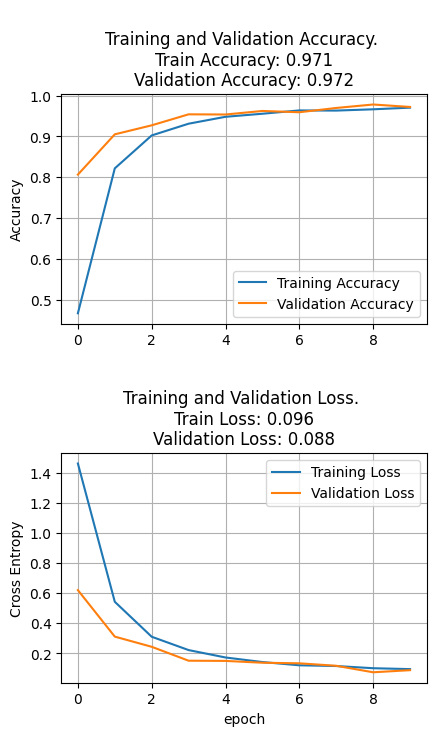

In [ ]:
plot_history(history)

In [ ]:
model.save('best_model.h5')

/Users/omachrekar/miniforge3/envs/work/lib/python3.10/site-packages/keras/src/engine/training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [ ]:
# import saved model
model = keras.models.load_model('best_model.h5')

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image
import os
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense, Dropout, Conv2D, MaxPooling2D, Flatten
from tensorflow.keras import layers
from sklearn.model_selection import train_test_split
import tensorflow_hub as hub

# Set some plot styles
sns.set_style("whitegrid")
plt.rcParams['figure.figsize'] = (10, 7)
plt.rcParams['font.size'] = 12

# --- Configuration and Corrected Paths ---
base_data_path = '/content/state-farm-distracted-driver-detection'
train_img_dir = os.path.join(base_data_path, 'train') # This is the directory with c0, c1, etc.
test_img_dir = os.path.join(base_data_path, 'test')   # This is the directory with test images directly

TRAINING_EPOCHS = 30  # Define the number of epochs

# --- Load DataFrames ---
train_metadata_path = os.path.join(base_data_path, '/content/driver_imgs_list.csv')
train_df_raw = pd.read_csv(train_metadata_path)

test_image_files = os.listdir(test_img_dir)
test_image_files = [f for f in test_image_files if f.lower().endswith(('.png', '.jpg', '.jpeg'))]
test_df = pd.DataFrame({'filename': test_image_files})

print("Original Training Metadata (/content/driver_imgs_list.csv):")
print(train_df_raw.head())
print("\nTesting DataFrame (created from test folder):")
print(test_df.head())

# --- Data Preparation for Generators ---
train_df_raw.rename(columns={'img': 'filename', 'classname': 'label'}, inplace=True)

# *** CRITICAL CORRECTION HERE ***
# Create a new 'filepath' column that combines the 'label' (subfolder) and 'filename'
train_df_raw['filepath'] = train_df_raw.apply(
    lambda row: os.path.join(row['label'], row['filename']), axis=1
)
# Now, 'filepath' column looks like 'c0/img_10206.jpg'

# Split training data into training and validation sets
train_df, val_df = train_test_split(
    train_df_raw,
    test_size=0.2,  # Using a 20% validation split
    stratify=train_df_raw['subject'],  # Stratify by subject
    random_state=42
)

print(f"\nTraining set size: {len(train_df)}")
print(f"Validation set size: {len(val_df)}")
print(f"Test set size: {len(test_df)}")

# --- ImageDataGenerators ---
train_gen = ImageDataGenerator(
    rescale=1. / 255.,
    horizontal_flip=True,
    vertical_flip=False,
    zoom_range=0.05,
    rotation_range=25
)

train_generator = train_gen.flow_from_dataframe(
    dataframe=train_df,
    directory=train_img_dir,
    x_col='filepath', # *** USE THE NEW 'filepath' COLUMN HERE ***
    y_col='label',
    color_mode="rgb",
    target_size=(180, 180),
    class_mode="categorical",
    batch_size=32,
    shuffle=True,
    seed=42
)

val_gen = ImageDataGenerator(rescale=1. / 255.)

val_generator = val_gen.flow_from_dataframe(
    dataframe=val_df,
    directory=train_img_dir,
    x_col='filepath', # *** USE THE NEW 'filepath' COLUMN HERE ***
    y_col='label',
    color_mode="rgb",
    target_size=(180, 180),
    class_mode="categorical",
    batch_size=32,
    shuffle=False,
    seed=42
)

test_gen = ImageDataGenerator(rescale=1. / 255.)

test_generator = test_gen.flow_from_dataframe(
    dataframe=test_df,
    directory=test_img_dir,
    x_col='filename', # This is correct for test, as images are directly in 'test' folder
    y_col=None,
    color_mode="rgb",
    target_size=(180, 180),
    class_mode=None,
    batch_size=32,
    shuffle=False,
    seed=42
)

print("\nData Generators Setup:")
# These prints should now work correctly after the fix
print(f"Train Generator found {train_generator.samples} images belonging to {len(train_generator.class_indices)} classes.")
print(f"Validation Generator found {val_generator.samples} images belonging to {len(val_generator.class_indices)} classes.")
print(f"Test Generator found {test_generator.samples} images.")

# Get class names from the train_generator
class_names = list(train_generator.class_indices.keys())
print("\nClass Names:", class_names)
num_classes = len(class_names)

# --- Rest of your model code (VGG16, Inception, Xception, CNN, ViT) remains the same ---
# ... (No changes needed below this point for the current error)
# You can copy-paste the rest of your model definitions and training calls here.

Original Training Metadata (/content/driver_imgs_list.csv):
  subject classname            img
0    p012        c0  img_10206.jpg
1    p012        c0  img_27079.jpg
2    p012        c0  img_50749.jpg
3    p012        c0  img_97089.jpg
4    p012        c0  img_37741.jpg

Testing DataFrame (created from test folder):
        filename
0  img_97983.jpg
1  img_92259.jpg
2  img_64243.jpg
3   img_3813.jpg
4  img_74802.jpg

Training set size: 27939
Validation set size: 6985
Test set size: 4961
Found 27939 validated image filenames belonging to 10 classes.
Found 6985 validated image filenames belonging to 10 classes.
Found 4961 validated image filenames.

Data Generators Setup:
Train Generator found 27939 images belonging to 10 classes.
Validation Generator found 6985 images belonging to 10 classes.
Test Generator found 4961 images.

Class Names: ['c0', 'c1', 'c2', 'c3', 'c4', 'c5', 'c6', 'c7', 'c8', 'c9']


In [ ]:
import os

print("\n--- Verifying Image Paths ---")

# Get the first entry from your training DataFrame
first_train_filename_in_df = train_df.iloc[0]['filename']
first_train_label_in_df = train_df.iloc[0]['label']
first_train_filepath_in_df = train_df.iloc[0]['filepath']

# Construct the expected absolute path
expected_absolute_path = os.path.join(train_img_dir, first_train_filepath_in_df)

print(f"First training image filename (from CSV): {first_train_filename_in_df}")
print(f"First training image label (from CSV): {first_train_label_in_df}")
print(f"First training image relative path (from 'filepath' column): {first_train_filepath_in_df}")
print(f"Expected absolute path for first training image: {expected_absolute_path}")

# Check if the file actually exists at this path
if os.path.exists(expected_absolute_path):
    print(f"SUCCESS: The file EXISTS at {expected_absolute_path}")
else:
    print(f"FAILURE: The file DOES NOT EXIST at {expected_absolute_path}")
    print("Please double-check your 'train_img_dir' and how 'filepath' is constructed.")
    print("Also, confirm the actual directory and file names using 'ls -R /content/distracted-driver-detection/'")

# Example of how the directory structure should look for the generator to work
# ls /content/distracted-driver-detection/train/c0/img_10206.jpg


--- Verifying Image Paths ---
First training image filename (from CSV): img_61098.jpg
First training image label (from CSV): c4
First training image relative path (from 'filepath' column): c4/img_61098.jpg
Expected absolute path for first training image: /content/state-farm-distracted-driver-detection/train/c4/img_61098.jpg
SUCCESS: The file EXISTS at /content/state-farm-distracted-driver-detection/train/c4/img_61098.jpg


**c0**: Safe driving
**c1**: Texting - right (driver texting with their right hand)
**c2**: Talking on the phone - right (driver talking on the phone with their right hand)
**c3**: Texting - left (driver texting with their left hand)
**c4**: Talking on the phone - left (driver talking on the phone with their left hand)
**c5**: Operating the radio (driver interacting with the car's radio/infotainment system)
**c6**: Drinking (driver consuming a beverage)
**c7**: Reaching behind (driver reaching into the back seat or behind them)
**c8**: Hair and makeup (driver applying makeup or adjusting hair)
**c9**: Talking to passenger (driver interacting with a passenger)

# **VIT MODEL**

Found 27939 validated image filenames belonging to 10 classes.
Found 6985 validated image filenames belonging to 10 classes.


Model: "functional_4"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_4       │ (None, 64, 64, 3) │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ patch_extractor_1   │ (None, None, 192) │          0 │ input_layer_4[0]… │
│ (PatchExtractor)    │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ patch_encoder_1     │ (None, None, 64)  │     16,448 │ patch_extractor_… │
│ (PatchEncoder)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, None, 64)  │        128 │ patch_encoder_1[… │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ multi_head_attenti… │ (None, None, 64)  │     66,368 │ layer_normalizat… │
│ (MultiHeadAttentio… │                   │            │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add_4 (Add)         │ (None, None, 64)  │          0 │ patch_encoder_1[… │
│                     │                   │            │ multi_head_atten… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, None, 64)  │        128 │ add_4[0][0]       │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_14 (Dense)    │ (None, None, 128) │      8,320 │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_15 (Dense)    │ (None, None, 64)  │      8,256 │ dense_14[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add_5 (Add)         │ (None, None, 64)  │          0 │ add_4[0][0],      │
│                     │                   │            │ dense_15[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, None, 64)  │        128 │ add_5[0][0]       │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ multi_head_attenti… │ (None, None, 64)  │     66,368 │ layer_normalizat… │
│ (MultiHeadAttentio… │                   │            │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add_6 (Add)         │ (None, None, 64)  │          0 │ add_5[0][0],      │
│                     │                   │            │ multi_head_atten… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, None, 64)  │        128 │ add_6[0][0]       │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_16 (Dense)    │ (None, None, 128) │      8,320 │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_17 (Dense)    │ (None, None, 64)  │      8,256 │ dense_16[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add_7 (Add)         │ (None, None, 64)  │          0 │ add_6[0][0],      │
│                     │                   │            │ dense_17[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, None, 64)  │        128 │ add_7[0][0]       │
│ (LayerNormalizatio… │                   │            │                 

 Total params: 187,786 (733.54 KB)

 Trainable params: 187,786 (733.54 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/15


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


874/874 ━━━━━━━━━━━━━━━━━━━━ 54s 51ms/step - accuracy: 0.1292 - loss: 2.2863 - val_accuracy: 0.3682 - val_loss: 1.5868
Epoch 2/15
874/874 ━━━━━━━━━━━━━━━━━━━━ 42s 48ms/step - accuracy: 0.4754 - loss: 1.3731 - val_accuracy: 0.6929 - val_loss: 0.8792
Epoch 3/15
874/874 ━━━━━━━━━━━━━━━━━━━━ 40s 46ms/step - accuracy: 0.7605 - loss: 0.6849 - val_accuracy: 0.8136 - val_loss: 0.5558
Epoch 4/15
874/874 ━━━━━━━━━━━━━━━━━━━━ 38s 44ms/step - accuracy: 0.8570 - loss: 0.4389 - val_accuracy: 0.8674 - val_loss: 0.3938
Epoch 5/15
874/874 ━━━━━━━━━━━━━━━━━━━━ 39s 44ms/step - accuracy: 0.8927 - loss: 0.3235 - val_accuracy: 0.9018 - val_loss: 0.2998
Epoch 6/15
874/874 ━━━━━━━━━━━━━━━━━━━━ 44s 48ms/step - accuracy: 0.9149 - loss: 0.2559 - val_accuracy: 0.9230 - val_loss: 0.2566
Epoch 7/15
874/874 ━━━━━━━━━━━━━━━━━━━━ 40s 46ms/step - accuracy: 0.9277 - loss: 0.2202 - val_accuracy: 0.9331 - val_loss: 0.2307
Epoch 8/15
874/874 ━━━━━━━━━━━━━━━━━━━━ 39s 44ms/step - accuracy: 0.9437 - loss: 0.1740 - val_accurac

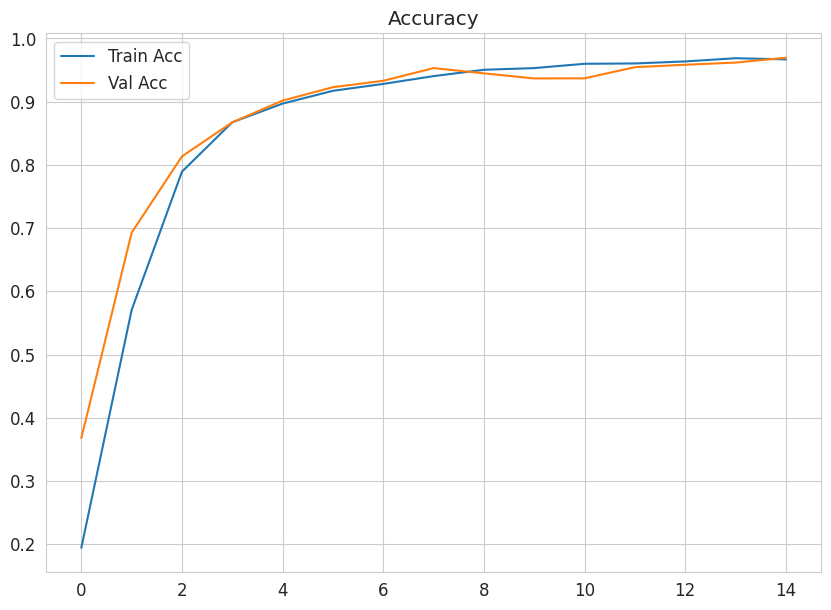

In [ ]:
import os
import numpy as np
import pandas as pd
import tensorflow as tf
from tensorflow.keras import layers, models
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt

# --- Config ---
IMG_SIZE = 64
PATCH_SIZE = 8
NUM_PATCHES = (IMG_SIZE // PATCH_SIZE) ** 2
EMBED_DIM = 64
NUM_HEADS = 4
FF_DIM = 128
NUM_CLASSES = 10
EPOCHS = 15
BATCH_SIZE = 32

# --- Paths ---
DATA_DIR = '/content/state-farm-distracted-driver-detection'
TRAIN_DIR = os.path.join(DATA_DIR, 'train')
CSV_PATH = os.path.join(DATA_DIR, '/content/driver_imgs_list.csv')

# --- Load Data ---
df = pd.read_csv(CSV_PATH)
df.rename(columns={'img': 'filename', 'classname': 'label'}, inplace=True)
df['filepath'] = df.apply(lambda r: os.path.join(TRAIN_DIR, r['label'], r['filename']), axis=1)

train_df, val_df = train_test_split(df, test_size=0.2, stratify=df['subject'], random_state=42)

# --- Image Generators ---
train_gen = ImageDataGenerator(rescale=1./255).flow_from_dataframe(
    train_df, x_col='filepath', y_col='label', target_size=(IMG_SIZE, IMG_SIZE), class_mode='categorical', batch_size=BATCH_SIZE)

val_gen = ImageDataGenerator(rescale=1./255).flow_from_dataframe(
    val_df, x_col='filepath', y_col='label', target_size=(IMG_SIZE, IMG_SIZE), class_mode='categorical', batch_size=BATCH_SIZE)

# --- Patch Layer ---
class PatchExtractor(layers.Layer):
    def __init__(self, patch_size):
        super().__init__()
        self.patch_size = patch_size

    def call(self, images):
        batch_size = tf.shape(images)[0]
        patches = tf.image.extract_patches(
            images=images,
            sizes=[1, self.patch_size, self.patch_size, 1],
            strides=[1, self.patch_size, self.patch_size, 1],
            rates=[1, 1, 1, 1],
            padding='VALID',
        )
        patches = tf.reshape(patches, [batch_size, -1, patches.shape[-1]])
        return patches

# --- Patch Encoder ---
class PatchEncoder(layers.Layer):
    def __init__(self, num_patches, projection_dim):
        super().__init__()
        self.projection = layers.Dense(projection_dim)
        self.pos_embedding = layers.Embedding(input_dim=num_patches, output_dim=projection_dim)

    def call(self, patch):
        positions = tf.range(start=0, limit=tf.shape(patch)[1], delta=1)
        encoded = self.projection(patch) + self.pos_embedding(positions)
        return encoded

# --- Transformer Block ---
def transformer_encoder(x, embed_dim, num_heads, ff_dim, dropout=0.1):
    # Multi-head self-attention
    x1 = layers.LayerNormalization()(x)
    attention_output = layers.MultiHeadAttention(num_heads=num_heads, key_dim=embed_dim)(x1, x1)
    x2 = layers.Add()([x, attention_output])

    # Feed-forward network
    x3 = layers.LayerNormalization()(x2)
    ffn = layers.Dense(ff_dim, activation='relu')(x3)
    ffn = layers.Dense(embed_dim)(ffn)
    return layers.Add()([x2, ffn])

# --- ViT Model ---
def build_vit():
    inputs = layers.Input(shape=(IMG_SIZE, IMG_SIZE, 3))
    patches = PatchExtractor(PATCH_SIZE)(inputs)
    encoded = PatchEncoder(NUM_PATCHES, EMBED_DIM)(patches)

    x = transformer_encoder(encoded, EMBED_DIM, NUM_HEADS, FF_DIM)
    x = transformer_encoder(x, EMBED_DIM, NUM_HEADS, FF_DIM)

    x = layers.LayerNormalization()(x)
    x = layers.GlobalAveragePooling1D()(x)
    x = layers.Dropout(0.2)(x)
    x = layers.Dense(64, activation='relu')(x)
    outputs = layers.Dense(NUM_CLASSES, activation='softmax')(x)

    model = models.Model(inputs, outputs)
    return model

model = build_vit()
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
model.summary()

# --- Train ---
history = model.fit(train_gen, validation_data=val_gen, epochs=EPOCHS)

# --- Plot ---
plt.plot(history.history['accuracy'], label='Train Acc')
plt.plot(history.history['val_accuracy'], label='Val Acc')
plt.title('Accuracy')
plt.legend()
plt.show()


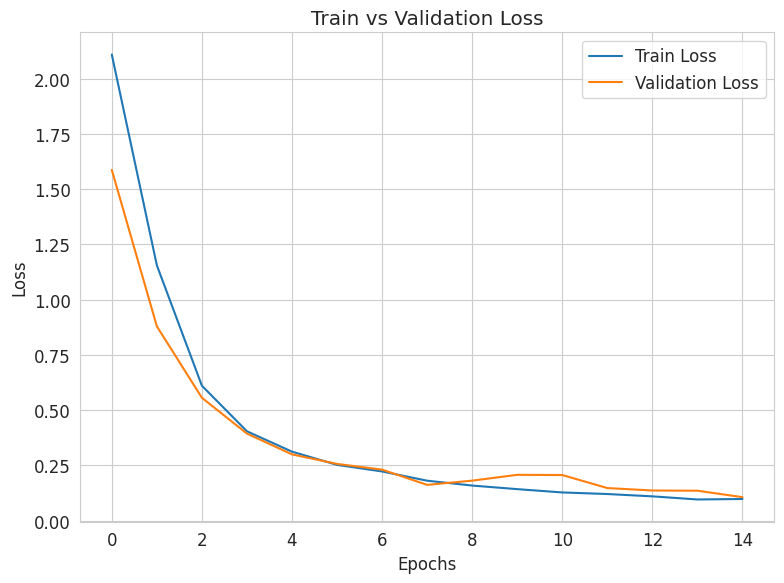

In [ ]:
loss = history.history['loss']
val_loss = history.history['val_loss']

plt.figure(figsize=(8, 6))
plt.plot(loss, label='Train Loss')
plt.plot(val_loss, label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Train vs Validation Loss')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.savefig('loss_curve.png', dpi=300)
plt.show()


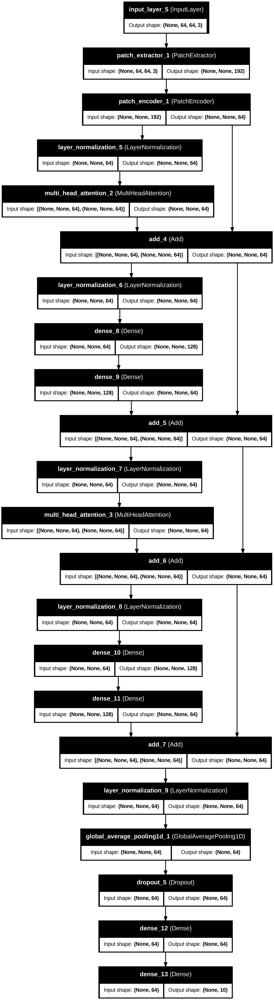

In [ ]:
from tensorflow.keras.utils import plot_model

plot_model(model, to_file='model_architecture.png', show_shapes=True, show_layer_names=True, dpi=300)


Found 27939 validated image filenames belonging to 10 classes.
Found 6985 validated image filenames belonging to 10 classes.


Model: "functional_36"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1       │ (None, 64, 64, 3) │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ patch_extractor     │ (None, None, 192) │          0 │ input_layer_1[0]… │
│ (PatchExtractor)    │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ patch_encoder       │ (None, None, 64)  │     16,448 │ patch_extractor[… │
│ (PatchEncoder)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, None, 64)  │        128 │ patch_encoder[0]… │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ multi_head_attenti… │ (None, None, 64)  │     66,368 │ layer_normalizat… │
│ (MultiHeadAttentio… │                   │            │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add_1 (Add)         │ (None, None, 64)  │          0 │ patch_encoder[0]… │
│                     │                   │            │ multi_head_atten… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, None, 64)  │        128 │ add_1[0][0]       │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_4 (Dense)     │ (None, None, 128) │      8,320 │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_5 (Dense)     │ (None, None, 64)  │      8,256 │ dense_4[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add_2 (Add)         │ (None, None, 64)  │          0 │ add_1[0][0],      │
│                     │                   │            │ dense_5[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, None, 64)  │        128 │ add_2[0][0]       │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ multi_head_attenti… │ (None, None, 64)  │     66,368 │ layer_normalizat… │
│ (MultiHeadAttentio… │                   │            │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add_3 (Add)         │ (None, None, 64)  │          0 │ add_2[0][0],      │
│                     │                   │            │ multi_head_atten… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, None, 64)  │        128 │ add_3[0][0]       │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_6 (Dense)     │ (None, None, 128) │      8,320 │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_7 (Dense)     │ (None, None, 64)  │      8,256 │ dense_6[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add_4 (Add)         │ (None, None, 64)  │          0 │ add_3[0][0],      │
│                     │                   │            │ dense_7[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, None, 64)  │        128 │ add_4[0][0]       │
│ (LayerNormalizatio… │                   │            │                 

 Total params: 187,786 (733.54 KB)

 Trainable params: 187,786 (733.54 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/20


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


874/874 ━━━━━━━━━━━━━━━━━━━━ 56s 51ms/step - accuracy: 0.1073 - loss: 2.3237 - val_accuracy: 0.2696 - val_loss: 1.9213
Epoch 2/20
874/874 ━━━━━━━━━━━━━━━━━━━━ 37s 42ms/step - accuracy: 0.3487 - loss: 1.6409 - val_accuracy: 0.6208 - val_loss: 1.0141
Epoch 3/20
874/874 ━━━━━━━━━━━━━━━━━━━━ 38s 44ms/step - accuracy: 0.7014 - loss: 0.8463 - val_accuracy: 0.8117 - val_loss: 0.5664
Epoch 4/20
874/874 ━━━━━━━━━━━━━━━━━━━━ 36s 41ms/step - accuracy: 0.8426 - loss: 0.4821 - val_accuracy: 0.8999 - val_loss: 0.3187
Epoch 5/20
874/874 ━━━━━━━━━━━━━━━━━━━━ 36s 41ms/step - accuracy: 0.9017 - loss: 0.3054 - val_accuracy: 0.9147 - val_loss: 0.2711
Epoch 6/20
874/874 ━━━━━━━━━━━━━━━━━━━━ 35s 40ms/step - accuracy: 0.9279 - loss: 0.2205 - val_accuracy: 0.9452 - val_loss: 0.1881
Epoch 7/20
874/874 ━━━━━━━━━━━━━━━━━━━━ 40s 45ms/step - accuracy: 0.9471 - loss: 0.1698 - val_accuracy: 0.9538 - val_loss: 0.1509
Epoch 8/20
874/874 ━━━━━━━━━━━━━━━━━━━━ 36s 41ms/step - accuracy: 0.9501 - loss: 0.1532 - val_accurac

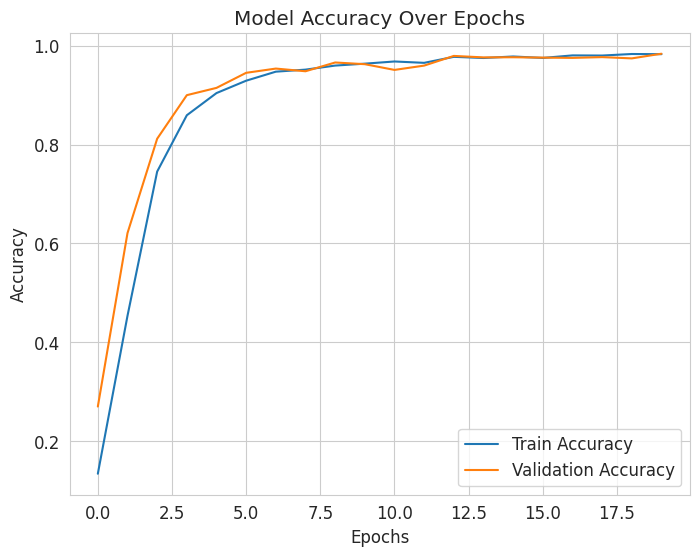

219/219 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step


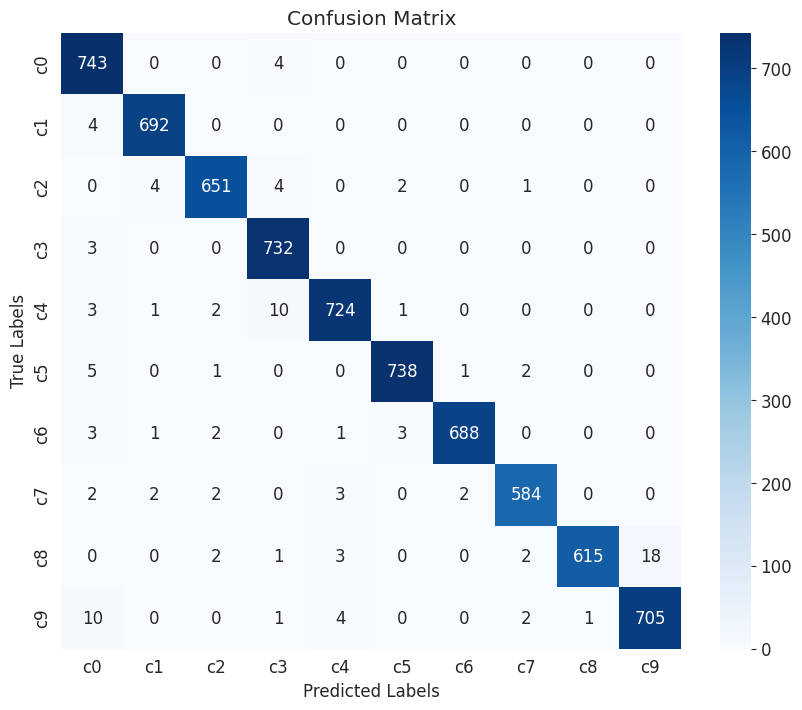


Classification Report:
              precision    recall  f1-score   support

          c0       0.96      0.99      0.98       747
          c1       0.99      0.99      0.99       696
          c2       0.99      0.98      0.98       662
          c3       0.97      1.00      0.98       735
          c4       0.99      0.98      0.98       741
          c5       0.99      0.99      0.99       747
          c6       1.00      0.99      0.99       698
          c7       0.99      0.98      0.98       595
          c8       1.00      0.96      0.98       641
          c9       0.98      0.98      0.98       723

    accuracy                           0.98      6985
   macro avg       0.98      0.98      0.98      6985
weighted avg       0.98      0.98      0.98      6985

vite model saved as vit_model.h5


In [36]:
import os
import numpy as np
import pandas as pd
import tensorflow as tf
from tensorflow.keras import layers, models
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

# --- Config ---
IMG_SIZE = 64
PATCH_SIZE = 8
NUM_PATCHES = (IMG_SIZE // PATCH_SIZE) ** 2
EMBED_DIM = 64
NUM_HEADS = 4
FF_DIM = 128
NUM_CLASSES = 10
EPOCHS = 20
BATCH_SIZE = 32

# --- Paths ---
DATA_DIR = '/content/state-farm-distracted-driver-detection'
TRAIN_DIR = os.path.join(DATA_DIR, 'train')
CSV_PATH = os.path.join(DATA_DIR, '/content/driver_imgs_list.csv')  # fixed extra slash

# --- Load Data ---
df = pd.read_csv(CSV_PATH)
df.rename(columns={'img': 'filename', 'classname': 'label'}, inplace=True)
df['filepath'] = df.apply(lambda r: os.path.join(TRAIN_DIR, r['label'], r['filename']), axis=1)

train_df, val_df = train_test_split(df, test_size=0.2, stratify=df['subject'], random_state=42)

# --- Image Generators ---
train_gen = ImageDataGenerator(rescale=1./255).flow_from_dataframe(
    train_df, x_col='filepath', y_col='label', target_size=(IMG_SIZE, IMG_SIZE),
    class_mode='categorical', batch_size=BATCH_SIZE
)

val_gen = ImageDataGenerator(rescale=1./255).flow_from_dataframe(
    val_df, x_col='filepath', y_col='label', target_size=(IMG_SIZE, IMG_SIZE),
    class_mode='categorical', batch_size=BATCH_SIZE, shuffle=False
)

# --- Patch Layer ---
class PatchExtractor(layers.Layer):
    def __init__(self, patch_size):
        super().__init__()
        self.patch_size = patch_size

    def call(self, images):
        batch_size = tf.shape(images)[0]
        patches = tf.image.extract_patches(
            images=images,
            sizes=[1, self.patch_size, self.patch_size, 1],
            strides=[1, self.patch_size, self.patch_size, 1],
            rates=[1, 1, 1, 1],
            padding='VALID',
        )
        return tf.reshape(patches, [batch_size, -1, patches.shape[-1]])

# --- Patch Encoder ---
class PatchEncoder(layers.Layer):
    def __init__(self, num_patches, projection_dim):
        super().__init__()
        self.projection = layers.Dense(projection_dim)
        self.pos_embedding = layers.Embedding(input_dim=num_patches, output_dim=projection_dim)

    def call(self, patch):
        positions = tf.range(start=0, limit=tf.shape(patch)[1], delta=1)
        encoded = self.projection(patch) + self.pos_embedding(positions)
        return encoded

# --- Transformer Block ---
def transformer_encoder(x, embed_dim, num_heads, ff_dim, dropout=0.1):
    x1 = layers.LayerNormalization()(x)
    attention_output = layers.MultiHeadAttention(num_heads=num_heads, key_dim=embed_dim)(x1, x1)
    x2 = layers.Add()([x, attention_output])
    x3 = layers.LayerNormalization()(x2)
    ffn = layers.Dense(ff_dim, activation='relu')(x3)
    ffn = layers.Dense(embed_dim)(ffn)
    return layers.Add()([x2, ffn])

# --- ViT Model ---
def build_vit():
    inputs = layers.Input(shape=(IMG_SIZE, IMG_SIZE, 3))
    patches = PatchExtractor(PATCH_SIZE)(inputs)
    encoded = PatchEncoder(NUM_PATCHES, EMBED_DIM)(patches)

    x = transformer_encoder(encoded, EMBED_DIM, NUM_HEADS, FF_DIM)
    x = transformer_encoder(x, EMBED_DIM, NUM_HEADS, FF_DIM)

    x = layers.LayerNormalization()(x)
    x = layers.GlobalAveragePooling1D()(x)
    x = layers.Dropout(0.2)(x)
    x = layers.Dense(64, activation='relu')(x)
    outputs = layers.Dense(NUM_CLASSES, activation='softmax')(x)

    return models.Model(inputs, outputs)

model = build_vit()
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
model.summary()

# --- Train ---
history = model.fit(train_gen, validation_data=val_gen, epochs=EPOCHS)

# --- Accuracy Plot ---
plt.figure(figsize=(8, 6))
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.title("Model Accuracy Over Epochs")
plt.legend()
plt.grid(True)
plt.savefig("accuracy_plot.png", dpi=300)
plt.show()

# --- Confusion Matrix ---
Y_pred = model.predict(val_gen)
y_pred = np.argmax(Y_pred, axis=1)
y_true = val_gen.classes
labels = list(val_gen.class_indices.keys())

cm = confusion_matrix(y_true, y_pred)
plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='d', xticklabels=labels, yticklabels=labels, cmap='Blues')
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.title("Confusion Matrix")
plt.savefig("confusion_matrix.png", dpi=300)
plt.show()

# --- Classification Report ---
print("\nClassification Report:")
print(classification_report(y_true, y_pred, target_names=labels))

model.save('vit_model.h5')
print("vite model saved as vit_model.h5")


# **EXPERIMENTAL PURPOSE WE WONT USE THIS**

In [ ]:
# import os
# import numpy as np
# import pandas as pd
# import tensorflow as tf
# from tensorflow.keras import layers, models
# from tensorflow.keras.preprocessing.image import ImageDataGenerator
# from sklearn.model_selection import train_test_split
# from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
# import matplotlib.pyplot as plt
# import cv2
# import random

# # --- Config ---
# IMG_SIZE = 48
# BATCH_SIZE = 32
# EPOCHS = 10
# NUM_CLASSES = 10
# EMBED_DIM = 64
# NUM_HEADS = 4

# # --- Paths ---
# DATA_DIR = "/content/state-farm-distracted-driver-detection"
# TRAIN_DIR = os.path.join(DATA_DIR, 'train')
# CSV_PATH = os.path.join(DATA_DIR, '/content/driver_imgs_list.csv')  # fixed path

# # --- Load and Prepare DataFrame ---
# df = pd.read_csv(CSV_PATH)
# df.rename(columns={'img': 'filename', 'classname': 'label'}, inplace=True)
# df['filepath'] = df.apply(lambda r: os.path.join(TRAIN_DIR, r['label'], r['filename']), axis=1)

# # --- Stratified Split ---
# train_df, val_df = train_test_split(df, test_size=0.2, stratify=df['subject'], random_state=42)

# # --- Image Generators ---
# datagen = ImageDataGenerator(rescale=1./255)
# train_gen = datagen.flow_from_dataframe(train_df, x_col='filepath', y_col='label',
#                                         target_size=(IMG_SIZE, IMG_SIZE), class_mode='categorical',
#                                         batch_size=BATCH_SIZE, shuffle=True)
# val_gen = datagen.flow_from_dataframe(val_df, x_col='filepath', y_col='label',
#                                       target_size=(IMG_SIZE, IMG_SIZE), class_mode='categorical',
#                                       batch_size=BATCH_SIZE, shuffle=False)

# # --- Build Optimized Hybrid Model ---
# def build_hybrid_model():
#     inputs = layers.Input(shape=(IMG_SIZE, IMG_SIZE, 3))
#     x = layers.Conv2D(32, (3, 3), padding='same', activation='relu')(inputs)
#     x = layers.MaxPooling2D()(x)
#     x = layers.BatchNormalization()(x)

#     x = layers.Conv2D(64, (3, 3), padding='same', activation='relu')(x)
#     x = layers.MaxPooling2D()(x)
#     x = layers.BatchNormalization()(x)

#     x = layers.Reshape((12 * 12, 64))(x)  # (144, 64)

#     # Transformer block
#     attn_input = layers.LayerNormalization()(x)
#     attn_output = layers.MultiHeadAttention(num_heads=NUM_HEADS, key_dim=16)(attn_input, attn_input)
#     x1 = layers.Add()([x, attn_output])
#     x1 = layers.LayerNormalization()(x1)
#     x1 = layers.Dense(64, activation='relu')(x1)

#     # BiLSTM block
#     x2 = layers.Bidirectional(layers.LSTM(64, return_sequences=True))(x)

#     # Merge
#     x = layers.Concatenate()([x1, x2])  # (144, 192)
#     x = layers.GlobalAveragePooling1D()(x)
#     x = layers.Dense(128, activation='relu')(x)
#     x = layers.Dropout(0.4)(x)
#     outputs = layers.Dense(NUM_CLASSES, activation='softmax', name="final_output")(x)

#     model = models.Model(inputs, outputs)
#     return model

# model = build_hybrid_model()
# model.compile(optimizer='adam',
#               loss='categorical_crossentropy',
#               metrics=[tf.keras.metrics.CategoricalAccuracy()])
# model.summary()

# # --- Callbacks ---
# callbacks = [
#     EarlyStopping(patience=5, restore_best_weights=True, monitor='val_loss'),
#     ReduceLROnPlateau(patience=3, factor=0.5, verbose=1, monitor='val_loss')
# ]

# # --- Train Model ---
# history = model.fit(train_gen,
#                     validation_data=val_gen,
#                     epochs=EPOCHS,
#                     callbacks=callbacks)

# # --- Plot Accuracy ---
# plt.plot(history.history['categorical_accuracy'], label='Train Acc')
# plt.plot(history.history['val_categorical_accuracy'], label='Val Acc')
# plt.title('Model Accuracy')
# plt.xlabel('Epoch')
# plt.ylabel('Accuracy')
# plt.legend()
# plt.grid(True)
# plt.show()


# **EXPERIMENTAL PURPOSE - WE WONT USE THIS**

In [ ]:
# import os
# import numpy as np
# import pandas as pd
# import tensorflow as tf
# from tensorflow.keras import layers, models
# from tensorflow.keras.preprocessing.image import ImageDataGenerator
# from sklearn.model_selection import train_test_split
# from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
# import matplotlib.pyplot as plt

# # --- Config ---
# IMG_SIZE = 48
# BATCH_SIZE = 32
# EPOCHS = 7
# NUM_CLASSES = 10
# NUM_HEADS = 4

# # --- Paths ---
# DATA_DIR = "/content/state-farm-distracted-driver-detection"
# TRAIN_DIR = os.path.join(DATA_DIR, 'train')
# CSV_PATH = os.path.join(DATA_DIR, '/content/driver_imgs_list.csv')

# # --- Load and Prepare DataFrame ---
# df = pd.read_csv(CSV_PATH)
# df.rename(columns={'img': 'filename', 'classname': 'label'}, inplace=True)
# df['filepath'] = df.apply(lambda r: os.path.join(TRAIN_DIR, r['label'], r['filename']), axis=1)

# # --- Stratified Split ---
# train_df, val_df = train_test_split(df, test_size=0.2, stratify=df['subject'], random_state=42)

# # --- Image Generators ---
# train_datagen = ImageDataGenerator(
#     rescale=1./255,
#     rotation_range=15,
#     width_shift_range=0.1,
#     height_shift_range=0.1,
#     zoom_range=0.1,
#     horizontal_flip=True
# )
# val_datagen = ImageDataGenerator(rescale=1./255)

# train_gen = train_datagen.flow_from_dataframe(train_df, x_col='filepath', y_col='label',
#                                               target_size=(IMG_SIZE, IMG_SIZE), class_mode='categorical',
#                                               batch_size=BATCH_SIZE, shuffle=True)
# val_gen = val_datagen.flow_from_dataframe(val_df, x_col='filepath', y_col='label',
#                                           target_size=(IMG_SIZE, IMG_SIZE), class_mode='categorical',
#                                           batch_size=BATCH_SIZE, shuffle=False)

# # --- Hybrid Model ---
# def build_hybrid_model():
#     inputs = layers.Input(shape=(IMG_SIZE, IMG_SIZE, 3))
#     x = layers.Conv2D(32, (3, 3), padding='same', activation='relu')(inputs)
#     x = layers.MaxPooling2D()(x)
#     x = layers.BatchNormalization()(x)

#     x = layers.Conv2D(64, (3, 3), padding='same', activation='relu')(x)
#     x = layers.MaxPooling2D()(x)
#     x = layers.BatchNormalization()(x)

#     x = layers.Reshape((12 * 12, 64))(x)  # (144, 64)

#     # Transformer block
#     attn_input = layers.LayerNormalization()(x)
#     attn_output = layers.MultiHeadAttention(num_heads=NUM_HEADS, key_dim=16)(attn_input, attn_input)
#     x1 = layers.Add()([x, attn_output])
#     x1 = layers.LayerNormalization()(x1)
#     x1 = layers.Dense(64, activation='relu')(x1)

#     # BiLSTM block
#     x2 = layers.Bidirectional(layers.LSTM(64, return_sequences=True))(x)

#     # Merge
#     x = layers.Concatenate()([x1, x2])  # (144, 192)
#     x = layers.GlobalAveragePooling1D()(x)
#     x = layers.Dense(128, activation='relu')(x)
#     x = layers.Dropout(0.5)(x)
#     outputs = layers.Dense(NUM_CLASSES, activation='softmax')(x)

#     model = models.Model(inputs, outputs)
#     return model

# model = build_hybrid_model()
# model.compile(optimizer='adam',
#               loss='categorical_crossentropy',
#               metrics=[tf.keras.metrics.CategoricalAccuracy()])

# # --- Callbacks ---
# callbacks = [
#     EarlyStopping(patience=3, restore_best_weights=True, monitor='val_loss'),
#     ReduceLROnPlateau(patience=2, factor=0.5, verbose=1, monitor='val_loss')
# ]

# # --- Train ---
# history = model.fit(train_gen,
#                     validation_data=val_gen,
#                     epochs=EPOCHS,
#                     callbacks=callbacks)

# # --- Visualization ---
# plt.figure(figsize=(14, 6))

# # Accuracy
# plt.subplot(1, 2, 1)
# plt.plot(history.history['categorical_accuracy'], label='Train Accuracy')
# plt.plot(history.history['val_categorical_accuracy'], label='Val Accuracy')
# plt.title('Model Accuracy over Epochs')
# plt.xlabel('Epoch')
# plt.ylabel('Accuracy')
# plt.legend()
# plt.grid(True)

# # Loss
# plt.subplot(1, 2, 2)
# plt.plot(history.history['loss'], label='Train Loss')
# plt.plot(history.history['val_loss'], label='Val Loss')
# plt.title('Model Loss over Epochs')
# plt.xlabel('Epoch')
# plt.ylabel('Loss')
# plt.legend()
# plt.grid(True)

# plt.tight_layout()
# plt.show()


# **ENSEMBLE ( CNN + TRANSFORMERS + BI LSTM)**

In [12]:
from tensorflow.keras import layers, models, regularizers, callbacks, optimizers
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.model_selection import train_test_split
import pandas as pd
import os

# --- Config ---
IMG_SIZE = 48
BATCH_SIZE = 32
EPOCHS = 30
NUM_CLASSES = 10

# --- Load Data ---
DATA_DIR = "/content/state-farm-distracted-driver-detection"
TRAIN_DIR = os.path.join(DATA_DIR, 'train')
CSV_PATH = os.path.join(DATA_DIR, '/content/driver_imgs_list.csv')

df = pd.read_csv(CSV_PATH)
df.rename(columns={'img': 'filename', 'classname': 'label'}, inplace=True)
df['filepath'] = df.apply(lambda r: os.path.join(TRAIN_DIR, r['label'], r['filename']), axis=1)

train_df, val_df = train_test_split(df, test_size=0.2, stratify=df['subject'], random_state=42)

# --- Image Generators with Augmentation ---
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    zoom_range=0.2,
    shear_range=0.1,
    horizontal_flip=True
)
val_datagen = ImageDataGenerator(rescale=1./255)

train_gen = train_datagen.flow_from_dataframe(train_df, x_col='filepath', y_col='label',
                                              target_size=(IMG_SIZE, IMG_SIZE), class_mode='categorical',
                                              batch_size=BATCH_SIZE, shuffle=True)

val_gen = val_datagen.flow_from_dataframe(val_df, x_col='filepath', y_col='label',
                                          target_size=(IMG_SIZE, IMG_SIZE), class_mode='categorical',
                                          batch_size=BATCH_SIZE, shuffle=False)

# --- Build Hybrid CNN + Transformer + BiLSTM Model ---
def build_model():
    inputs = layers.Input(shape=(IMG_SIZE, IMG_SIZE, 3))

    x = layers.Conv2D(32, 3, padding='same', activation='relu', kernel_regularizer=regularizers.l2(1e-4))(inputs)
    x = layers.MaxPooling2D()(x)
    x = layers.BatchNormalization()(x)

    x = layers.Conv2D(64, 3, padding='same', activation='relu', kernel_regularizer=regularizers.l2(1e-4))(x)
    x = layers.MaxPooling2D()(x)
    x = layers.BatchNormalization()(x)

    x = layers.Reshape((12 * 12, 64))(x)

    # Transformer block
    attn = layers.LayerNormalization()(x)
    attn = layers.MultiHeadAttention(num_heads=4, key_dim=16)(attn, attn)
    attn = layers.Add()([x, attn])
    attn = layers.LayerNormalization()(attn)
    attn = layers.Dense(64, activation='relu')(attn)

    # BiLSTM block
    lstm = layers.Bidirectional(layers.LSTM(64, return_sequences=True))(x)

    x = layers.Concatenate()([attn, lstm])
    x = layers.GlobalAveragePooling1D()(x)
    x = layers.Dense(128, activation='relu', kernel_regularizer=regularizers.l2(1e-4))(x)
    x = layers.Dropout(0.5)(x)
    outputs = layers.Dense(NUM_CLASSES, activation='softmax')(x)

    return models.Model(inputs, outputs)

# --- Compile and Train ---
model = build_model()
model.compile(
    optimizer=optimizers.Adam(1e-3),
    loss='categorical_crossentropy',
    metrics=['categorical_accuracy']
)

# --- Callbacks ---
callbacks_list = [
    callbacks.EarlyStopping(monitor='val_loss', patience=4, restore_best_weights=True),
    callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.3, patience=2, verbose=1),
    callbacks.ModelCheckpoint('best_model.h5', save_best_only=True, monitor='val_loss')
]

# --- Train ---
history = model.fit(
    train_gen,
    validation_data=val_gen,
    epochs=EPOCHS,
    callbacks=callbacks_list
)

model.save('ensemble_hybrid_model.h5')
print("Hybrid/Ensemble model saved as ensemble_hybrid_model.h5")


Found 27939 validated image filenames belonging to 10 classes.
Found 6985 validated image filenames belonging to 10 classes.
Epoch 1/30


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


874/874 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - categorical_accuracy: 0.1782 - loss: 2.1824

874/874 ━━━━━━━━━━━━━━━━━━━━ 82s 82ms/step - categorical_accuracy: 0.1783 - loss: 2.1821 - val_categorical_accuracy: 0.3460 - val_loss: 1.8489 - learning_rate: 0.0010
Epoch 2/30
874/874 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - categorical_accuracy: 0.4547 - loss: 1.4925

874/874 ━━━━━━━━━━━━━━━━━━━━ 68s 77ms/step - categorical_accuracy: 0.4548 - loss: 1.4923 - val_categorical_accuracy: 0.5738 - val_loss: 1.1847 - learning_rate: 0.0010
Epoch 3/30
874/874 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - categorical_accuracy: 0.6618 - loss: 0.9965

874/874 ━━━━━━━━━━━━━━━━━━━━ 82s 77ms/step - categorical_accuracy: 0.6618 - loss: 0.9964 - val_categorical_accuracy: 0.7197 - val_loss: 0.8748 - learning_rate: 0.0010
Epoch 4/30
874/874 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - categorical_accuracy: 0.7660 - loss: 0.7436

874/874 ━━━━━━━━━━━━━━━━━━━━ 68s 78ms/step - categorical_accuracy: 0.7660 - loss: 0.7436 - val_categorical_accuracy: 0.7462 - val_loss: 0.7866 - learning_rate: 0.0010
Epoch 5/30
874/874 ━━━━━━━━━━━━━━━━━━━━ 85s 82ms/step - categorical_accuracy: 0.8166 - loss: 0.5957 - val_categorical_accuracy: 0.6232 - val_loss: 1.3343 - learning_rate: 0.0010
Epoch 6/30
874/874 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - categorical_accuracy: 0.8543 - loss: 0.4898
Epoch 6: ReduceLROnPlateau reducing learning rate to 0.0003000000142492354.
874/874 ━━━━━━━━━━━━━━━━━━━━ 67s 77ms/step - categorical_accuracy: 0.8543 - loss: 0.4898 - val_categorical_accuracy: 0.6507 - val_loss: 1.2628 - learning_rate: 0.0010
Epoch 7/30
874/874 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - categorical_accuracy: 0.8913 - loss: 0.3825

874/874 ━━━━━━━━━━━━━━━━━━━━ 68s 78ms/step - categorical_accuracy: 0.8913 - loss: 0.3825 - val_categorical_accuracy: 0.8010 - val_loss: 0.6403 - learning_rate: 3.0000e-04
Epoch 8/30
874/874 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - categorical_accuracy: 0.9100 - loss: 0.3264

874/874 ━━━━━━━━━━━━━━━━━━━━ 68s 77ms/step - categorical_accuracy: 0.9100 - loss: 0.3264 - val_categorical_accuracy: 0.8604 - val_loss: 0.4618 - learning_rate: 3.0000e-04
Epoch 9/30
874/874 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - categorical_accuracy: 0.9182 - loss: 0.2965

874/874 ━━━━━━━━━━━━━━━━━━━━ 68s 77ms/step - categorical_accuracy: 0.9181 - loss: 0.2965 - val_categorical_accuracy: 0.8819 - val_loss: 0.4047 - learning_rate: 3.0000e-04
Epoch 10/30
874/874 ━━━━━━━━━━━━━━━━━━━━ 66s 76ms/step - categorical_accuracy: 0.9237 - loss: 0.2825 - val_categorical_accuracy: 0.8388 - val_loss: 0.5597 - learning_rate: 3.0000e-04
Epoch 11/30
874/874 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - categorical_accuracy: 0.9273 - loss: 0.2717

874/874 ━━━━━━━━━━━━━━━━━━━━ 68s 78ms/step - categorical_accuracy: 0.9273 - loss: 0.2717 - val_categorical_accuracy: 0.8892 - val_loss: 0.3788 - learning_rate: 3.0000e-04
Epoch 12/30
874/874 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - categorical_accuracy: 0.9327 - loss: 0.2599

874/874 ━━━━━━━━━━━━━━━━━━━━ 67s 77ms/step - categorical_accuracy: 0.9327 - loss: 0.2599 - val_categorical_accuracy: 0.9287 - val_loss: 0.2724 - learning_rate: 3.0000e-04
Epoch 13/30
874/874 ━━━━━━━━━━━━━━━━━━━━ 68s 78ms/step - categorical_accuracy: 0.9314 - loss: 0.2561 - val_categorical_accuracy: 0.9079 - val_loss: 0.3321 - learning_rate: 3.0000e-04
Epoch 14/30
874/874 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - categorical_accuracy: 0.9384 - loss: 0.2423
Epoch 14: ReduceLROnPlateau reducing learning rate to 9.000000427477062e-05.
874/874 ━━━━━━━━━━━━━━━━━━━━ 81s 77ms/step - categorical_accuracy: 0.9384 - loss: 0.2423 - val_categorical_accuracy: 0.8724 - val_loss: 0.4643 - learning_rate: 3.0000e-04
Epoch 15/30
874/874 ━━━━━━━━━━━━━━━━━━━━ 68s 77ms/step - categorical_accuracy: 0.9477 - loss: 0.2118 - val_categorical_accuracy: 0.8835 - val_loss: 0.3965 - learning_rate: 9.0000e-05
Epoch 16/30
874/874 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - categorical_accuracy: 0.9495 - loss: 0.2009
Epoch 16: Reduc

Hybrid/Ensemble model saved as ensemble_hybrid_model.h5


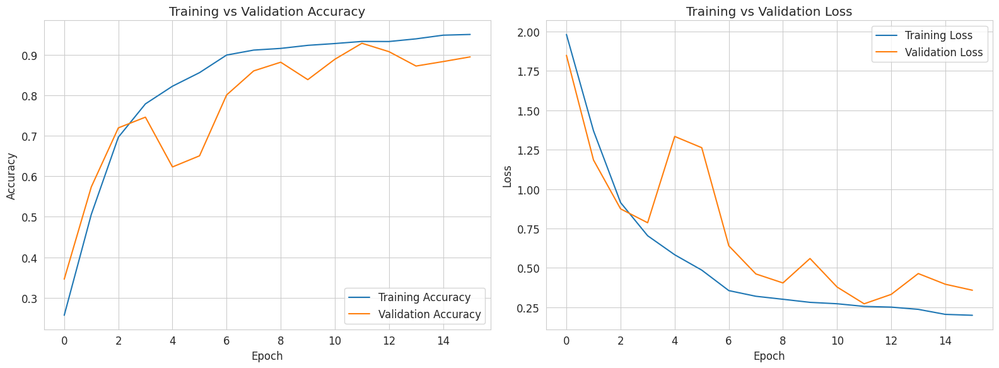

In [13]:
import matplotlib.pyplot as plt

# Assuming you have stored the history returned by model.fit() as `history`
acc = history.history['categorical_accuracy']
val_acc = history.history['val_categorical_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(len(acc))

plt.figure(figsize=(16, 6))

# Accuracy plot
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.title('Training vs Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(loc='lower right')
plt.grid(True)

# Loss plot
plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.title('Training vs Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(loc='upper right')
plt.grid(True)

plt.tight_layout()
plt.show()


In [ ]:
print(globals().keys())

dict_keys(['__name__', '__doc__', '__package__', '__loader__', '__spec__', '__builtin__', '__builtins__', '_ih', '_oh', '_dh', 'In', 'Out', 'get_ipython', 'exit', 'quit', '_', '__', '___', '_i', '_ii', '_iii', '_i1', 'os', 'pd', 'tf', 'hub', 'Model', 'Dropout', 'Dense', 'Input', 'ImageDataGenerator', 'train_test_split', 'Sequential', 'IMG_SIZE', 'BATCH_SIZE', 'EPOCHS', 'AUTOTUNE', 'base_path', 'train_csv', 'train_dir', 'test_dir', 'df', 'test_image_files', 'test_df', 'train_df', 'val_df', 'datagen', 'valgen', 'test_gen_pred', 'train_gen', 'val_gen', 'test_gen', 'num_classes', 'class_names', 'vit_url', 'input_tensor', 'vit_feature_extractor', '_i2', 'vit_model_handle', '_i3', 'gen', '_i4', 'np', 'plt', 'keras', 'applications', 'load_model', 'Conv2D', 'MaxPooling2D', 'GlobalAveragePooling2D', 'Flatten', 'image', 'layers', '_i5', 'TRAINING_EPOCHS', '_i6', '_exit_code', '_i7', '_i8', '_i9', '_i10', 'sns', 'Image', '_i11', 'data_dir', 'image_paths', 'labels', 'class_name', 'class_dir', 'ima

219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step


<Figure size 1000x800 with 0 Axes>

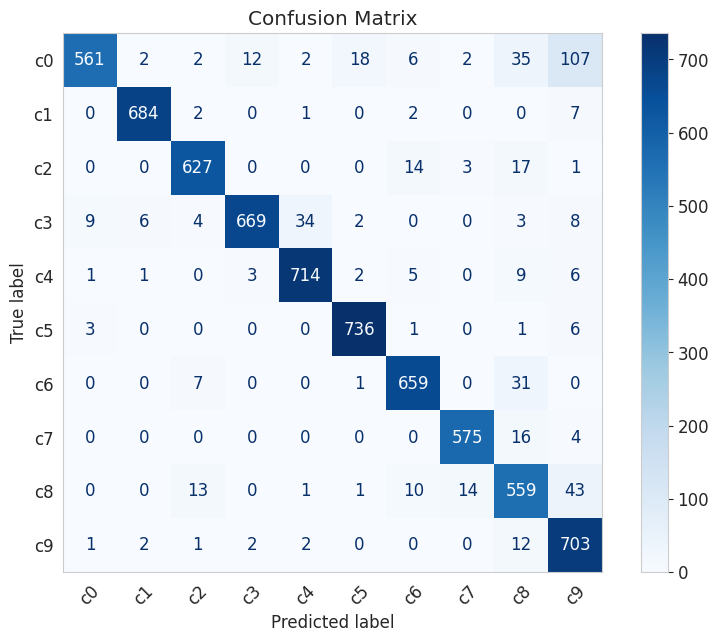

Classification Report:

              precision    recall  f1-score   support

          c0       0.98      0.75      0.85       747
          c1       0.98      0.98      0.98       696
          c2       0.96      0.95      0.95       662
          c3       0.98      0.91      0.94       735
          c4       0.95      0.96      0.96       741
          c5       0.97      0.99      0.98       747
          c6       0.95      0.94      0.94       698
          c7       0.97      0.97      0.97       595
          c8       0.82      0.87      0.84       641
          c9       0.79      0.97      0.87       723

    accuracy                           0.93      6985
   macro avg       0.93      0.93      0.93      6985
weighted avg       0.93      0.93      0.93      6985



In [14]:
import numpy as np
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt

# Get true labels
y_true = val_gen.classes

# Get predicted probabilities
y_pred_prob = model.predict(val_gen, verbose=1)

# Convert probabilities to class labels
y_pred = np.argmax(y_pred_prob, axis=1)

# Get class labels
class_labels = list(val_gen.class_indices.keys())

# Confusion Matrix
cm = confusion_matrix(y_true, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_labels)

plt.figure(figsize=(10, 8))
disp.plot(cmap=plt.cm.Blues, xticks_rotation=45)
plt.title("Confusion Matrix")
plt.grid(False)
plt.show()

# Classification Report
print("Classification Report:\n")
print(classification_report(y_true, y_pred, target_names=class_labels))


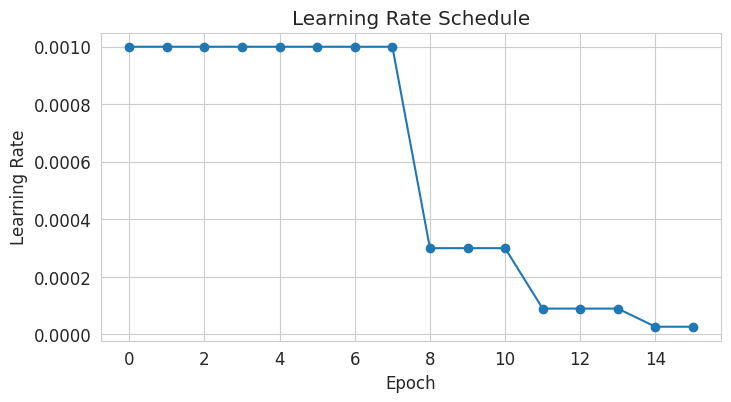

In [ ]:
lr = history.history['learning_rate']

plt.figure(figsize=(8, 4))
plt.plot(epochs_range, lr, marker='o')
plt.title('Learning Rate Schedule')
plt.xlabel('Epoch')
plt.ylabel('Learning Rate')
plt.grid(True)
plt.show()


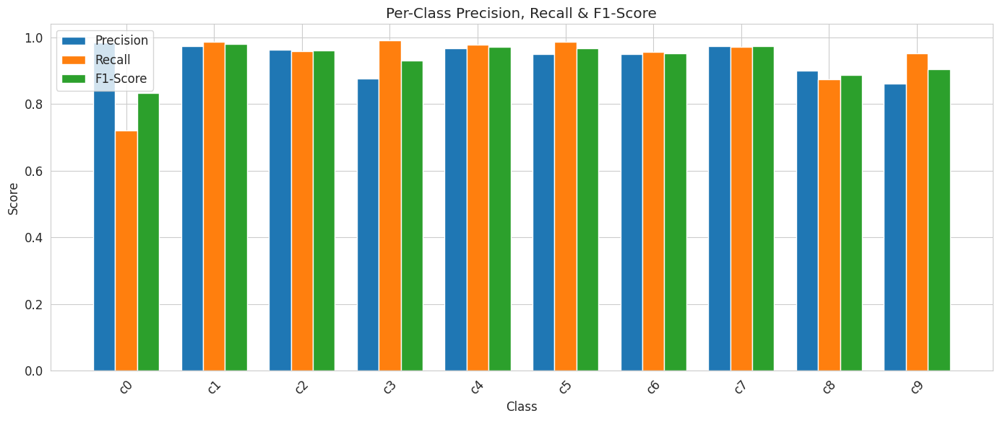

In [ ]:
from sklearn.metrics import precision_recall_fscore_support

precision, recall, f1, _ = precision_recall_fscore_support(y_true, y_pred)

x = np.arange(len(class_labels))
width = 0.25

plt.figure(figsize=(14, 6))
plt.bar(x - width, precision, width, label='Precision')
plt.bar(x, recall, width, label='Recall')
plt.bar(x + width, f1, width, label='F1-Score')

plt.xlabel("Class")
plt.ylabel("Score")
plt.title("Per-Class Precision, Recall & F1-Score")
plt.xticks(x, class_labels, rotation=45)
plt.legend()
plt.tight_layout()
plt.show()


219/219 ━━━━━━━━━━━━━━━━━━━━ 35s 158ms/step


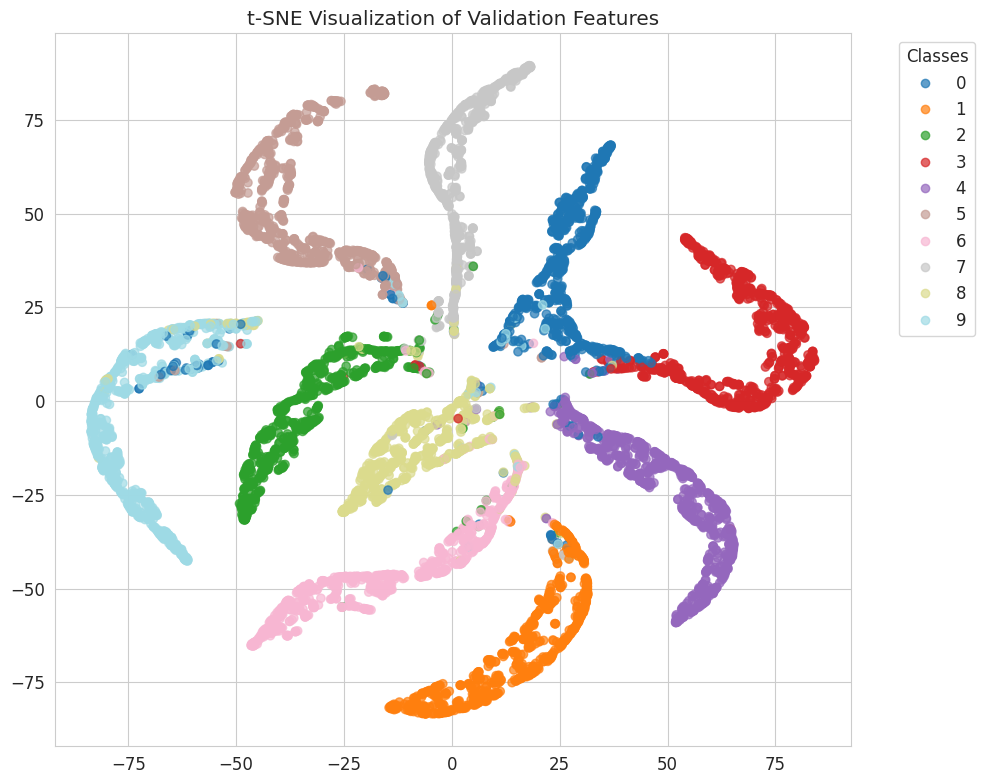

In [ ]:
from sklearn.manifold import TSNE

# Extract features and labels
features = model.predict(val_gen)
features_2d = TSNE(n_components=2, random_state=42).fit_transform(features)

plt.figure(figsize=(10, 8))
scatter = plt.scatter(features_2d[:, 0], features_2d[:, 1], c=y_true, cmap='tab20', alpha=0.7)
plt.legend(*scatter.legend_elements(), title="Classes", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.title("t-SNE Visualization of Validation Features")
plt.tight_layout()
plt.show()


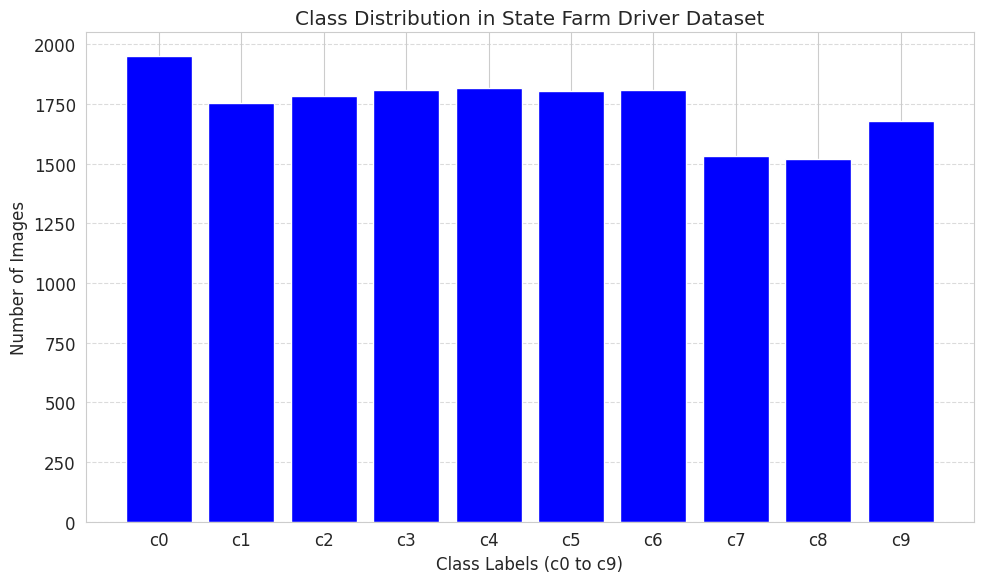

In [ ]:
import os
import matplotlib.pyplot as plt

# Path to your train directory
train_dir = '/content/state-farm-distracted-driver-detection/train'

# Count images per class
class_counts = {}
for class_name in sorted(os.listdir(train_dir)):
    class_path = os.path.join(train_dir, class_name)
    if os.path.isdir(class_path):
        count = len([f for f in os.listdir(class_path) if f.lower().endswith(('.jpg', '.png', '.jpeg'))])
        class_counts[class_name] = count

# Plot the bar chart
plt.figure(figsize=(10, 6))
plt.bar(class_counts.keys(), class_counts.values(), color='blue')
plt.xlabel('Class Labels (c0 to c9)')
plt.ylabel('Number of Images')
plt.title('Class Distribution in State Farm Driver Dataset')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()


In [ ]:
for i, layer in enumerate(model.layers):
    print(f"{i}: {layer.name} — {layer.__class__.__name__}")


0: input_layer_13 — InputLayer
1: conv2d_10 — Conv2D
2: max_pooling2d_10 — MaxPooling2D
3: batch_normalization_6 — BatchNormalization
4: conv2d_11 — Conv2D
5: max_pooling2d_11 — MaxPooling2D
6: batch_normalization_7 — BatchNormalization
7: reshape_6 — Reshape
8: layer_normalization_27 — LayerNormalization
9: multi_head_attention_12 — MultiHeadAttention
10: add_19 — Add
11: layer_normalization_28 — LayerNormalization
12: dense_40 — Dense
13: bidirectional_6 — Bidirectional
14: concatenate_6 — Concatenate
15: global_average_pooling1d_9 — GlobalAveragePooling1D
16: dense_41 — Dense
17: dropout_22 — Dropout
18: dense_42 — Dense


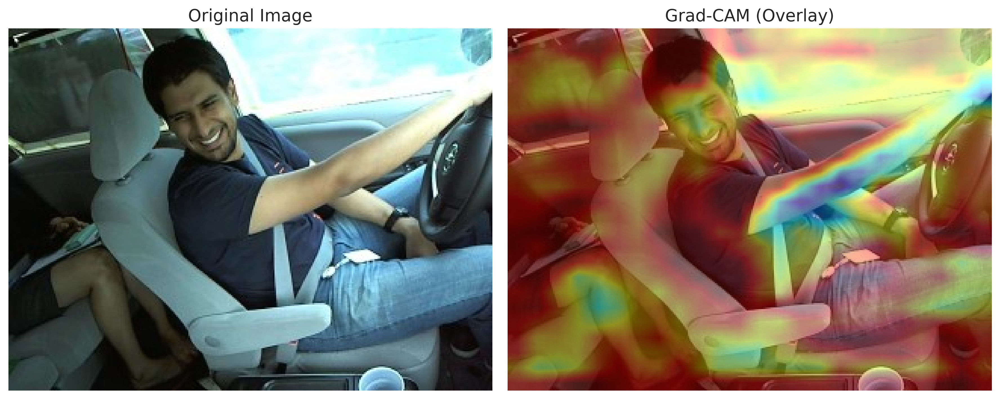

In [33]:
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras.models import Model
import cv2
from PIL import Image

# --- Step 1: Grad-CAM Heatmap ---
def make_gradcam_heatmap(img_array, model, last_conv_layer_name, pred_index=None):
    grad_model = Model(
        inputs=model.inputs,
        outputs=[
            model.get_layer(last_conv_layer_name).output,
            model.output
        ]
    )

    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        if pred_index is None:
            pred_index = tf.argmax(predictions[0])
        class_output = predictions[:, pred_index]

    grads = tape.gradient(class_output, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    conv_outputs = conv_outputs[0]
    heatmap = conv_outputs @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)
    heatmap = tf.maximum(heatmap, 0) / tf.math.reduce_max(heatmap)
    return heatmap.numpy()

# --- Step 2: Load and Preprocess Image ---
def load_preprocess_image(img_path, model_input_size=(48, 48)):
    img_orig = Image.open(img_path).convert("RGB")  # keep high-res
    img_resized = img_orig.resize(model_input_size)
    img_array = tf.keras.preprocessing.image.img_to_array(img_resized) / 255.0
    return np.expand_dims(img_array, axis=0), img_orig

# --- Step 3: Superimpose High-Quality Heatmap ---
def superimpose_heatmap(heatmap, original_image, alpha=0.4):
    original_np = np.array(original_image)
    heatmap_resized = cv2.resize(heatmap, (original_np.shape[1], original_np.shape[0]))
    heatmap_resized = np.uint8(255 * heatmap_resized)
    heatmap_color = cv2.applyColorMap(heatmap_resized, cv2.COLORMAP_JET)
    superimposed_img = cv2.addWeighted(original_np, 1 - alpha, heatmap_color, alpha, 0)
    return Image.fromarray(superimposed_img)

# --- Step 4: Execute ---
img_path = '/content/state-farm-distracted-driver-detection/test/img_101513.jpg'  # Your high-res test image
target_layer = 'conv2d_1'  # Adjust based on your model

img_array, high_res_pil = load_preprocess_image(img_path, model_input_size=(48, 48))
heatmap = make_gradcam_heatmap(img_array, model, target_layer)
superimposed_img = superimpose_heatmap(heatmap, high_res_pil)

# --- Step 5: Save with High DPI ---
fig = plt.figure(figsize=(12, 6), dpi=300)
plt.subplot(1, 2, 1)
plt.title("Original Image")
plt.imshow(high_res_pil)
plt.axis('off')

plt.subplot(1, 2, 2)
plt.title("Grad-CAM (Overlay)")
plt.imshow(superimposed_img)
plt.axis('off')

plt.tight_layout()
plt.savefig("gradcam_highres.png", dpi=600, bbox_inches='tight', pad_inches=0.1)
plt.show()


In [34]:
import os
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import cv2
from PIL import Image
from tensorflow.keras.models import Model

# --- Settings ---
train_dir = '/content/state-farm-distracted-driver-detection/train'
target_layer = 'conv2d_1'  # adjust based on your model
output_dir = '/content/gradcam_outputs'  # change as needed
os.makedirs(output_dir, exist_ok=True)

# --- Grad-CAM Helper ---
def make_gradcam_heatmap(img_array, model, last_conv_layer_name, pred_index=None):
    grad_model = Model(
        inputs=model.inputs,
        outputs=[
            model.get_layer(last_conv_layer_name).output,
            model.output
        ]
    )

    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        if pred_index is None:
            pred_index = tf.argmax(predictions[0])
        class_output = predictions[:, pred_index]

    grads = tape.gradient(class_output, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))
    conv_outputs = conv_outputs[0]
    heatmap = conv_outputs @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)
    heatmap = tf.maximum(heatmap, 0) / tf.math.reduce_max(heatmap)
    return heatmap.numpy()

# --- Load and Preprocess Image ---
def load_image(image_path, model_input_size=(48, 48)):
    img_pil = Image.open(image_path).convert("RGB")
    img_resized = img_pil.resize(model_input_size)
    img_array = tf.keras.preprocessing.image.img_to_array(img_resized) / 255.0
    img_array = np.expand_dims(img_array, axis=0)
    return img_array, img_pil

# --- Overlay Heatmap on Original Image ---
def overlay_heatmap(heatmap, original_img, alpha=0.4):
    orig = np.array(original_img)
    heatmap_resized = cv2.resize(heatmap, (orig.shape[1], orig.shape[0]))
    heatmap_colored = cv2.applyColorMap(np.uint8(255 * heatmap_resized), cv2.COLORMAP_JET)
    superimposed = cv2.addWeighted(orig, 1 - alpha, heatmap_colored, alpha, 0)
    return Image.fromarray(superimposed)

# --- Main Loop: One Image per Class ---
for class_name in sorted(os.listdir(train_dir)):
    class_path = os.path.join(train_dir, class_name)
    if not os.path.isdir(class_path):
        continue

    # Pick the first image in the class
    for file_name in os.listdir(class_path):
        if file_name.lower().endswith(('.jpg', '.jpeg', '.png')):
            img_path = os.path.join(class_path, file_name)
            img_array, img_pil = load_image(img_path, model_input_size=(48, 48))
            heatmap = make_gradcam_heatmap(img_array, model, last_conv_layer_name=target_layer)
            gradcam_image = overlay_heatmap(heatmap, img_pil)

            # Save with label
            save_path = os.path.join(output_dir, f"gradcam_{class_name}.png")
            gradcam_image.save(save_path)
            print(f"[✓] Saved Grad-CAM for class {class_name} at {save_path}")
            break  # Only one image per class


[✓] Saved Grad-CAM for class c0 at /content/gradcam_outputs/gradcam_c0.png
[✓] Saved Grad-CAM for class c1 at /content/gradcam_outputs/gradcam_c1.png
[✓] Saved Grad-CAM for class c2 at /content/gradcam_outputs/gradcam_c2.png
[✓] Saved Grad-CAM for class c3 at /content/gradcam_outputs/gradcam_c3.png
[✓] Saved Grad-CAM for class c4 at /content/gradcam_outputs/gradcam_c4.png
[✓] Saved Grad-CAM for class c5 at /content/gradcam_outputs/gradcam_c5.png
[✓] Saved Grad-CAM for class c6 at /content/gradcam_outputs/gradcam_c6.png
[✓] Saved Grad-CAM for class c7 at /content/gradcam_outputs/gradcam_c7.png
[✓] Saved Grad-CAM for class c8 at /content/gradcam_outputs/gradcam_c8.png
[✓] Saved Grad-CAM for class c9 at /content/gradcam_outputs/gradcam_c9.png


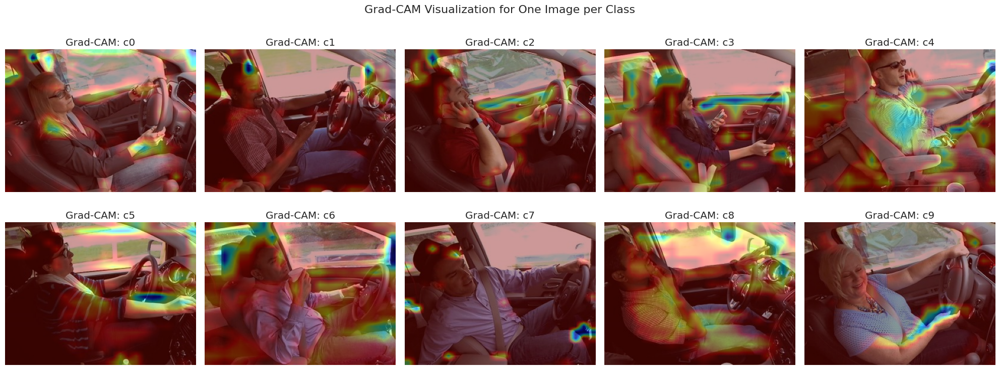

In [35]:
import os
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import cv2
from PIL import Image
from tensorflow.keras.models import Model

# --- Configuration ---
train_dir = '/content/state-farm-distracted-driver-detection/train'
target_layer = 'conv2d_1'  # Replace with actual conv layer name if different
input_size = (48, 48)      # Match your model input shape

# --- Grad-CAM Helper ---
def make_gradcam_heatmap(img_array, model, last_conv_layer_name, pred_index=None):
    grad_model = Model(
        inputs=model.inputs,
        outputs=[
            model.get_layer(last_conv_layer_name).output,
            model.output
        ]
    )

    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        if pred_index is None:
            pred_index = tf.argmax(predictions[0])
        class_output = predictions[:, pred_index]

    grads = tape.gradient(class_output, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))
    conv_outputs = conv_outputs[0]
    heatmap = conv_outputs @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)
    heatmap = tf.maximum(heatmap, 0) / tf.math.reduce_max(heatmap)
    return heatmap.numpy()

# --- Load and Preprocess Image ---
def load_image(image_path, target_size=(48, 48)):
    img_pil = Image.open(image_path).convert("RGB")
    img_resized = img_pil.resize(target_size)
    img_array = tf.keras.preprocessing.image.img_to_array(img_resized) / 255.0
    img_array = np.expand_dims(img_array, axis=0)
    return img_array, img_pil

# --- Superimpose Heatmap ---
def overlay_heatmap(heatmap, image, alpha=0.4):
    original = np.array(image)
    heatmap_resized = cv2.resize(heatmap, (original.shape[1], original.shape[0]))
    heatmap_colored = cv2.applyColorMap(np.uint8(255 * heatmap_resized), cv2.COLORMAP_JET)
    superimposed = cv2.addWeighted(original, 1 - alpha, heatmap_colored, alpha, 0)
    return Image.fromarray(superimposed)

# --- Display Grad-CAMs ---
plt.figure(figsize=(20, 8))
class_names = sorted(os.listdir(train_dir))
for idx, class_name in enumerate(class_names):
    class_path = os.path.join(train_dir, class_name)
    if not os.path.isdir(class_path):
        continue
    img_files = [f for f in os.listdir(class_path) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
    if not img_files:
        continue
    img_path = os.path.join(class_path, img_files[0])  # Take first image
    img_array, img_pil = load_image(img_path, target_size=input_size)
    heatmap = make_gradcam_heatmap(img_array, model, target_layer)
    gradcam_img = overlay_heatmap(heatmap, img_pil)

    plt.subplot(2, 5, idx + 1)
    plt.imshow(gradcam_img)
    plt.title(f"Grad-CAM: {class_name}")
    plt.axis('off')

plt.suptitle("Grad-CAM Visualization for One Image per Class", fontsize=16)
plt.tight_layout()
plt.show()


In [ ]:
import tensorflow as tf
import numpy as np

def make_gradcam_heatmap(img_array, model, last_conv_layer_name, pred_index=None):
    grad_model = tf.keras.models.Model(
        [model.inputs],
        [model.get_layer(last_conv_layer_name).output, model.output]
    )

    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        if pred_index is None:
            pred_index = tf.argmax(predictions[0])
        class_channel = predictions[:, pred_index]

    grads = tape.gradient(class_channel, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    conv_outputs = conv_outputs[0]
    heatmap = conv_outputs @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)

    heatmap = tf.maximum(heatmap, 0) / tf.reduce_max(heatmap + tf.keras.backend.epsilon())
    return heatmap.numpy()


In [ ]:
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import cv2

def save_and_display_gradcam(img_path, heatmap, alpha=0.4):
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
    heatmap = np.uint8(255 * heatmap)

    colormap = cm.get_cmap("jet")
    colored_heatmap = colormap(heatmap / 255.0)[:, :, :3]
    colored_heatmap = np.uint8(255 * colored_heatmap)

    superimposed_img = cv2.addWeighted(img, 1 - alpha, colored_heatmap, alpha, 0)

    # Plot
    plt.figure(figsize=(18, 6))

    plt.subplot(1, 3, 1)
    plt.imshow(img)
    plt.title("Original Image")
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.imshow(heatmap, cmap='jet')
    plt.title("Grad-CAM Heatmap")
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.imshow(superimposed_img)
    plt.title("Grad-CAM Overlay")
    plt.axis('off')

    plt.tight_layout()
    plt.show()


<ipython-input-73-1519775642>:12: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colormap = cm.get_cmap("jet")


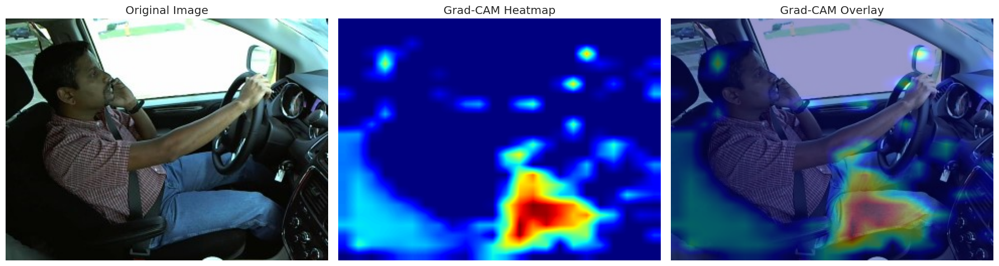

In [ ]:
# Replace with your image path
img_path = sample_path  # path to an image in your dataset

# Load and preprocess
img = tf.keras.preprocessing.image.load_img(img_path, target_size=(48, 48))
img_array = tf.keras.preprocessing.image.img_to_array(img)
img_array = np.expand_dims(img_array, axis=0) / 255.0  # Normalize

# Set correct last conv layer
last_conv_layer_name = "conv2d_11"

# Generate Grad-CAM
heatmap = make_gradcam_heatmap(img_array, model, last_conv_layer_name)

# Display result
save_and_display_gradcam(img_path, heatmap)


<ipython-input-73-1519775642>:12: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colormap = cm.get_cmap("jet")


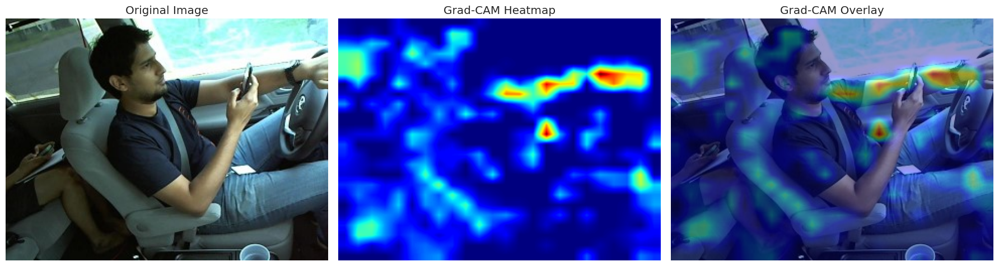

In [ ]:
# Replace with your image path
img_path ='/content/state-farm-distracted-driver-detection/test/img_100046.jpg'  # path to an image in your dataset

# Load and preprocess
img = tf.keras.preprocessing.image.load_img(img_path, target_size=(48, 48))
img_array = tf.keras.preprocessing.image.img_to_array(img)
img_array = np.expand_dims(img_array, axis=0) / 255.0  # Normalize

# Set correct last conv layer
last_conv_layer_name = "conv2d_11"

# Generate Grad-CAM
heatmap = make_gradcam_heatmap(img_array, model, last_conv_layer_name)

# Display result
save_and_display_gradcam(img_path, heatmap)

<ipython-input-73-1519775642>:12: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colormap = cm.get_cmap("jet")


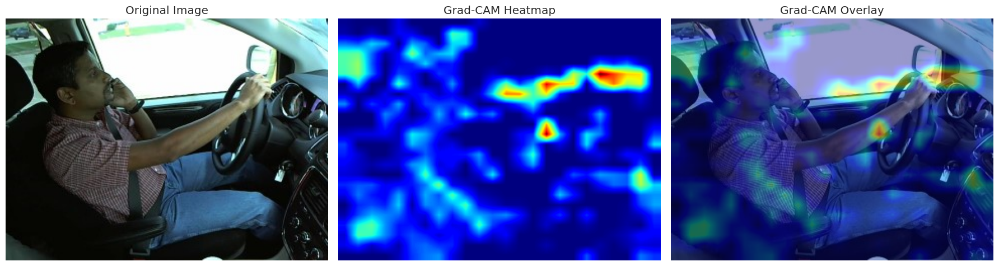

In [ ]:
heatmap = make_gradcam_heatmap(img_array, model, last_conv_layer_name="conv2d_11")
save_and_display_gradcam(sample_path, heatmap)


In [ ]:
from tensorflow.keras.models import load_model

# Load your saved model
model = load_model("/content/best_model.h5")


In [ ]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import cv2
from tensorflow.keras.preprocessing import image

# Load trained model
model = tf.keras.models.load_model("/content/best_model.h5")

# Load and preprocess image
img_path = "/content/state-farm-distracted-driver-detection/test/img_100015.jpg"  # 🔁 Replace with your test image path
img = image.load_img(img_path, target_size=(48, 48))
img_array = image.img_to_array(img)
img_array = np.expand_dims(img_array / 255.0, axis=0).astype(np.float32)  # Shape: (1, 48, 48, 3)


In [ ]:
def integrated_gradients(model, img_tensor, target_class_idx, baseline=None, steps=50):
    if baseline is None:
        baseline = tf.zeros_like(img_tensor)

    alphas = tf.linspace(0.0, 1.0, steps + 1)
    interpolated = tf.concat([
        baseline + alpha * (img_tensor - baseline) for alpha in alphas
    ], axis=0)

    with tf.GradientTape() as tape:
        tape.watch(interpolated)
        preds = model(interpolated)
        probs = preds[:, target_class_idx]

    grads = tape.gradient(probs, interpolated)
    avg_grads = tf.reduce_mean(grads, axis=0)
    integrated_grads = (img_tensor - baseline)[0] * avg_grads
    return integrated_grads.numpy()


In [ ]:
def plot_integrated_gradients(original_img, attributions):
    attributions = np.mean(np.abs(attributions), axis=-1)  # (48, 48)
    attributions = cv2.resize(attributions, (original_img.shape[2], original_img.shape[1]))

    plt.figure(figsize=(12, 4))

    plt.subplot(1, 2, 1)
    plt.imshow(original_img[0])
    plt.title("Original Image")
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(attributions, cmap='hot')
    plt.title("Integrated Gradients")
    plt.axis('off')

    plt.tight_layout()
    plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step


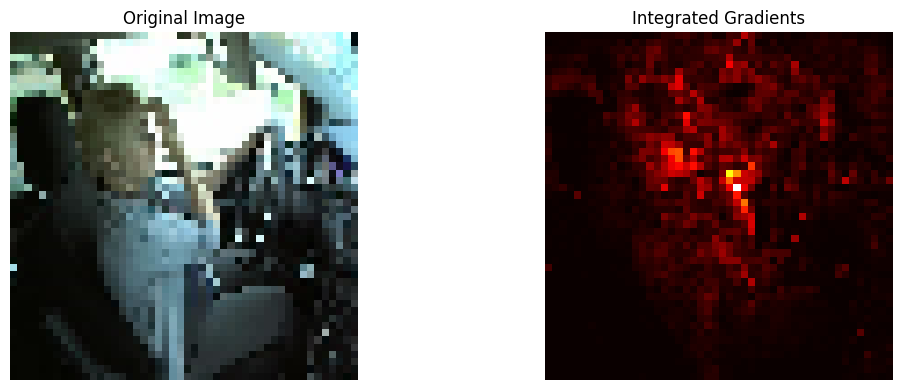

Prediction: [[9.1007544e-04 8.0416112e-06 2.6384549e-04 3.2850676e-07 9.8002674e-05
  2.5728703e-04 7.8674912e-02 1.9663603e-04 9.1940147e-01 1.8935115e-04]]
Target class: 8
Attribution shape: (48, 48, 3)


In [ ]:
pred = model.predict(img_array)
target_class_idx = np.argmax(pred)

attr = integrated_gradients(model, tf.convert_to_tensor(img_array), target_class_idx)
plot_integrated_gradients(img_array, attr)
print("Prediction:", pred)
print("Target class:", target_class_idx)
print("Attribution shape:", attr.shape)


In [ ]:
baseline = tf.convert_to_tensor(np.ones_like(img_array) * 0.5, dtype=tf.float32)


In [ ]:
def smooth_integrated_gradients(model, img_tensor, target_class_idx, baseline, steps=50, noise=0.1, n_samples=10):
    total_grads = np.zeros_like(img_tensor[0])
    for _ in range(n_samples):
        noise_img = img_tensor + noise * tf.random.normal(img_tensor.shape)
        total_grads += integrated_gradients(model, noise_img, target_class_idx, baseline, steps)
    return total_grads / n_samples


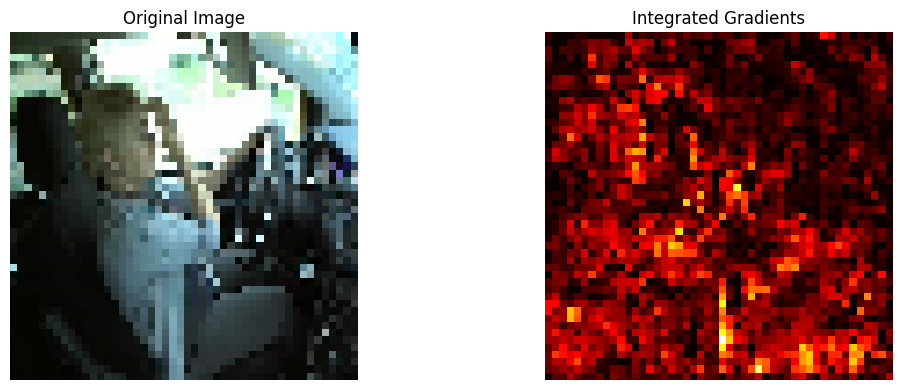

In [ ]:
# Make sure cv2 is imported
!pip install opencv-python
import cv2
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt

# ... (Previous cells defining model, img_array, target_class_idx, integrated_gradients, smooth_integrated_gradients, plot_integrated_gradients, baseline)

# Calculate attributions using smooth_integrated_gradients
# Ensure you have model, img_array, target_class_idx, and baseline defined from previous cells
attributions = smooth_integrated_gradients(model, tf.convert_to_tensor(img_array), target_class_idx, baseline)

# Now process the calculated attributions
attributions = np.maximum(attributions, 0)
attributions = attributions / np.max(attributions)

# You might want to plot the smoothed attributions as well
plot_integrated_gradients(img_array, attributions)

In [ ]:
!pip uninstall -y tf-explain
!pip install git+https://github.com/sicara/tf-explain.git

Found existing installation: tf-explain 0.3.1
Uninstalling tf-explain-0.3.1:
  Successfully uninstalled tf-explain-0.3.1
  Cloning https://github.com/sicara/tf-explain.git to /tmp/pip-req-build-aj1fwdan
  Running command git clone --filter=blob:none --quiet https://github.com/sicara/tf-explain.git /tmp/pip-req-build-aj1fwdan
  Resolved https://github.com/sicara/tf-explain.git to commit 9d7d1e900ec3e3e4b5338fbc43dfb93539acecc2
  Preparing metadata (setup.py) ... done
  Created wheel for tf-explain: filename=tf_explain-0.3.1-py3-none-any.whl size=43585 sha256=47286f5fa165fe6c207ae0aea9d0eac19a7e72baa23d3ca24da8c3840721ae95
  Stored in directory: /tmp/pip-ephem-wheel-cache-6mt57v3h/wheels/43/eb/ca/6fdc033253c2709cb7ac86d9ab281cb96f1b15ecb0289d8889
Successfully built tf-explain


In [ ]:
from tensorflow.keras.models import load_model

# Load the model you trained
model = load_model('/content/best_model.h5')


In [ ]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
from tensorflow.keras.models import load_model
import tensorflow as tf


In [ ]:
model = load_model("/content/best_model.h5", compile=False)


In [ ]:
def preprocess_input(img_path, target_size=(48, 48)):
    img = tf.keras.preprocessing.image.load_img(img_path, target_size=target_size)
    img_array = tf.keras.preprocessing.image.img_to_array(img)
    img_array = img_array / 255.0  # Normalize
    return np.expand_dims(img_array, axis=0)

image_path = "/content/state-farm-distracted-driver-detection/test/img_100027.jpg"
img_array = preprocess_input(image_path)


In [ ]:
def scorecam(model, img_array, class_index, layer_name):
    grad_model = tf.keras.models.Model(
        [model.inputs], [model.get_layer(layer_name).output, model.output]
    )

    conv_outputs, predictions = grad_model(img_array)
    conv_outputs = conv_outputs[0].numpy()
    pred_class_score = predictions[0][class_index]

    weights = []
    for i in range(conv_outputs.shape[-1]):
        heatmap = conv_outputs[..., i]
        heatmap = np.maximum(heatmap, 0)
        heatmap = heatmap / (np.max(heatmap) + 1e-8)

        heatmap_resized = cv2.resize(heatmap, (img_array.shape[2], img_array.shape[1]))
        masked_img = img_array[0] * np.expand_dims(heatmap_resized, axis=-1)
        masked_img = np.expand_dims(masked_img, axis=0)

        score = model(masked_img)[0][class_index].numpy()
        weights.append(score)

    weights = np.array(weights)
    cam = np.dot(conv_outputs, weights)
    cam = np.maximum(cam, 0)
    cam = cam / (np.max(cam) + 1e-8)
    return cam


In [ ]:
def show_scorecam(image_path, cam):
    img = cv2.imread(image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    cam = cv2.resize(cam, (img.shape[1], img.shape[0]))
    cam = np.uint8(255 * cam)
    heatmap = cv2.applyColorMap(cam, cv2.COLORMAP_JET)

    if heatmap.shape != img.shape:
        heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))

    overlay = cv2.addWeighted(img, 0.6, heatmap, 0.4, 0)

    plt.figure(figsize=(10, 5))
    plt.imshow(overlay)
    plt.title("ScoreCAM Heatmap Overlay")
    plt.axis('off')
    plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   
Predicted class: 9


/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: [['input_layer_13']]
Received: inputs=Tensor(shape=(1, 48, 48, 3))
  warnings.warn(msg)


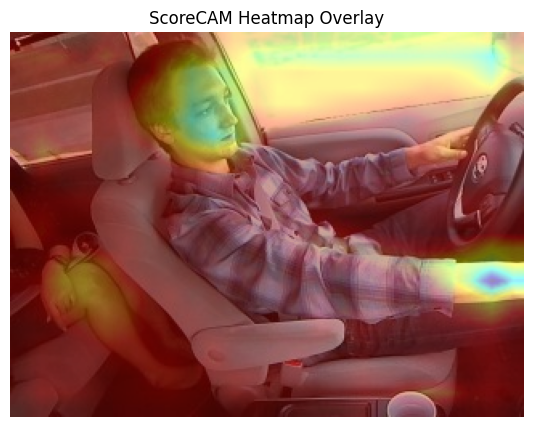

In [ ]:
pred = model.predict(img_array)
class_index = np.argmax(pred)
print("Predicted class:", class_index)

cam = scorecam(model, img_array, class_index, layer_name="conv2d_11")
show_scorecam(image_path, cam)


**Image 2 - IG **

In [ ]:
model = load_model("/content/best_model.h5", compile=False)


In [ ]:
def preprocess_input(img_path, target_size=(48, 48)):
    img = tf.keras.preprocessing.image.load_img(img_path, target_size=target_size)
    img_array = tf.keras.preprocessing.image.img_to_array(img)
    img_array = img_array / 255.0  # Normalize
    return np.expand_dims(img_array, axis=0)

image_path = "/content/state-farm-distracted-driver-detection/test/img_100108.jpg"
img_array = preprocess_input(image_path)


In [ ]:
def scorecam(model, img_array, class_index, layer_name):
    grad_model = tf.keras.models.Model(
        [model.inputs], [model.get_layer(layer_name).output, model.output]
    )

    conv_outputs, predictions = grad_model(img_array)
    conv_outputs = conv_outputs[0].numpy()
    pred_class_score = predictions[0][class_index]

    weights = []
    for i in range(conv_outputs.shape[-1]):
        heatmap = conv_outputs[..., i]
        heatmap = np.maximum(heatmap, 0)
        heatmap = heatmap / (np.max(heatmap) + 1e-8)

        heatmap_resized = cv2.resize(heatmap, (img_array.shape[2], img_array.shape[1]))
        masked_img = img_array[0] * np.expand_dims(heatmap_resized, axis=-1)
        masked_img = np.expand_dims(masked_img, axis=0)

        score = model(masked_img)[0][class_index].numpy()
        weights.append(score)

    weights = np.array(weights)
    cam = np.dot(conv_outputs, weights)
    cam = np.maximum(cam, 0)
    cam = cam / (np.max(cam) + 1e-8)
    return cam


In [ ]:
def show_scorecam(image_path, cam):
    img = cv2.imread(image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    cam = cv2.resize(cam, (img.shape[1], img.shape[0]))
    cam = np.uint8(255 * cam)
    heatmap = cv2.applyColorMap(cam, cv2.COLORMAP_JET)

    if heatmap.shape != img.shape:
        heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))

    overlay = cv2.addWeighted(img, 0.6, heatmap, 0.4, 0)

    plt.figure(figsize=(10, 5))
    plt.imshow(overlay)
    plt.title("ScoreCAM Heatmap Overlay")
    plt.axis('off')
    plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 561ms/step
Predicted class: 8


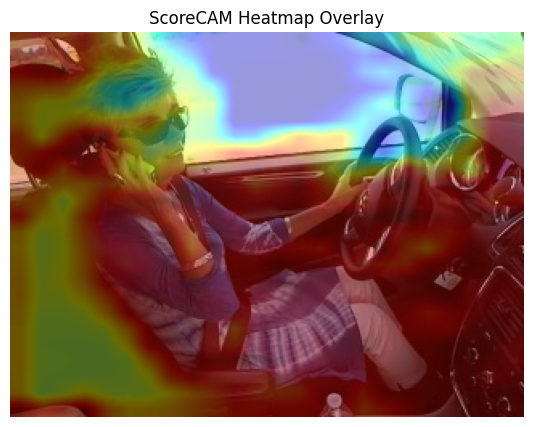

In [ ]:
pred = model.predict(img_array)
class_index = np.argmax(pred)
print("Predicted class:", class_index)

cam = scorecam(model, img_array, class_index, layer_name="conv2d_11")
show_scorecam(image_path, cam)


In [ ]:


def preprocess_input(img_path, target_size=(48, 48)):
    img = tf.keras.preprocessing.image.load_img(img_path, target_size=target_size)
    img_array = tf.keras.preprocessing.image.img_to_array(img)
    img_array = img_array / 255.0  # Normalize
    return np.expand_dims(img_array, axis=0)

image_path = "/content/state-farm-distracted-driver-detection/test/img_26914.jpg"
img_array = preprocess_input(image_path)

In [ ]:
def scorecam(model, img_array, class_index, layer_name):
    grad_model = tf.keras.models.Model(
        [model.inputs], [model.get_layer(layer_name).output, model.output]
    )

    conv_outputs, predictions = grad_model(img_array)
    conv_outputs = conv_outputs[0].numpy()
    pred_class_score = predictions[0][class_index]

    weights = []
    for i in range(conv_outputs.shape[-1]):
        heatmap = conv_outputs[..., i]
        heatmap = np.maximum(heatmap, 0)
        heatmap = heatmap / (np.max(heatmap) + 1e-8)

        heatmap_resized = cv2.resize(heatmap, (img_array.shape[2], img_array.shape[1]))
        masked_img = img_array[0] * np.expand_dims(heatmap_resized, axis=-1)
        masked_img = np.expand_dims(masked_img, axis=0)

        score = model(masked_img)[0][class_index].numpy()
        weights.append(score)

    weights = np.array(weights)
    cam = np.dot(conv_outputs, weights)
    cam = np.maximum(cam, 0)
    cam = cam / (np.max(cam) + 1e-8)
    return cam

In [ ]:
def show_scorecam(image_path, cam):
    img = cv2.imread(image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    cam = cv2.resize(cam, (img.shape[1], img.shape[0]))
    cam = np.uint8(255 * cam)
    heatmap = cv2.applyColorMap(cam, cv2.COLORMAP_JET)

    if heatmap.shape != img.shape:
        heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))

    overlay = cv2.addWeighted(img, 0.6, heatmap, 0.4, 0)

    plt.figure(figsize=(10, 5))
    plt.imshow(overlay)
    plt.title("ScoreCAM Heatmap Overlay")
    plt.axis('off')
    plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step
Predicted class: 8


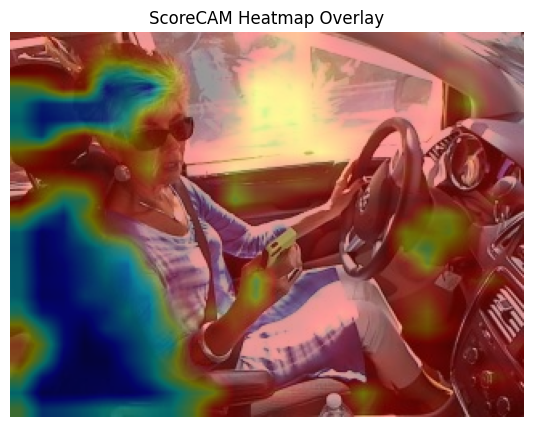

In [ ]:
pred = model.predict(img_array)
class_index = np.argmax(pred)
print("Predicted class:", class_index)

cam = scorecam(model, img_array, class_index, layer_name="conv2d_11")
show_scorecam(image_path, cam)

In [ ]:


def preprocess_input(img_path, target_size=(48, 48)):
    img = tf.keras.preprocessing.image.load_img(img_path, target_size=target_size)
    img_array = tf.keras.preprocessing.image.img_to_array(img)
    img_array = img_array / 255.0  # Normalize
    return np.expand_dims(img_array, axis=0)

image_path = "/content/state-farm-distracted-driver-detection/test/img_16231.jpg"
img_array = preprocess_input(image_path)

In [ ]:
def scorecam(model, img_array, class_index, layer_name):
    grad_model = tf.keras.models.Model(
        [model.inputs], [model.get_layer(layer_name).output, model.output]
    )

    conv_outputs, predictions = grad_model(img_array)
    conv_outputs = conv_outputs[0].numpy()
    pred_class_score = predictions[0][class_index]

    weights = []
    for i in range(conv_outputs.shape[-1]):
        heatmap = conv_outputs[..., i]
        heatmap = np.maximum(heatmap, 0)
        heatmap = heatmap / (np.max(heatmap) + 1e-8)

        heatmap_resized = cv2.resize(heatmap, (img_array.shape[2], img_array.shape[1]))
        masked_img = img_array[0] * np.expand_dims(heatmap_resized, axis=-1)
        masked_img = np.expand_dims(masked_img, axis=0)

        score = model(masked_img)[0][class_index].numpy()
        weights.append(score)

    weights = np.array(weights)
    cam = np.dot(conv_outputs, weights)
    cam = np.maximum(cam, 0)
    cam = cam / (np.max(cam) + 1e-8)
    return cam

In [ ]:
def show_scorecam(image_path, cam):
    img = cv2.imread(image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    cam = cv2.resize(cam, (img.shape[1], img.shape[0]))
    cam = np.uint8(255 * cam)
    heatmap = cv2.applyColorMap(cam, cv2.COLORMAP_JET)

    if heatmap.shape != img.shape:
        heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))

    overlay = cv2.addWeighted(img, 0.6, heatmap, 0.4, 0)

    plt.figure(figsize=(10, 5))
    plt.imshow(overlay)
    plt.title("ScoreCAM Heatmap Overlay")
    plt.axis('off')
    plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
Predicted class: 7


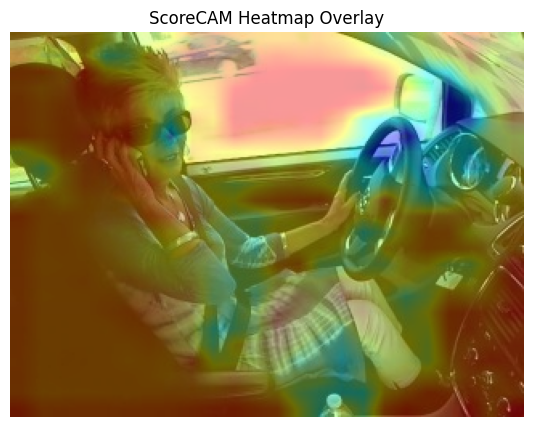

In [ ]:
pred = model.predict(img_array)
class_index = np.argmax(pred)
print("Predicted class:", class_index)

cam = scorecam(model, img_array, class_index, layer_name="conv2d_11")
show_scorecam(image_path, cam)